# Hudson Valley Gentrification and Changes in Farming

## Notebook 1: Clustering

In [1]:
import geopandas as gpd
import pandas as pd
import contextily as cx
import seaborn as sns
import matplotlib.pyplot as plt
import os
import pointpats as ptp
from pysal.lib import weights
from pysal.explore import esda
from splot.esda import plot_moran
from splot.esda import plot_local_autocorrelation
import shapely
import numpy as np
from scipy import stats
import hdbscan
# import nasspython

c:\Users\Darcy Krasne\.conda\envs\info615\Lib\site-packages\spaghetti\network.py:41: FutureWarning: The next major release of pysal/spaghetti (2.0.0) will drop support for all ``libpysal.cg`` geometries. This change is a first step in refactoring ``spaghetti`` that is expected to result in dramatically reduced runtimes for network instantiation and operations. Users currently requiring network and point pattern input as ``libpysal.cg`` geometries should prepare for this simply by converting to ``shapely`` geometries.
  warnings.warn(dep_msg, FutureWarning, stacklevel=1)


In [2]:
api_key_stadia = os.getenv("STADIA_API_KEY")
api_key_census = os.getenv("CENSUS_API_KEY")
# api_key_nass = os.getenv("QUICK_STATS_API_KEY")

## Define functions

In [3]:
def meters_to_miles(meters):
    return meters/1609
def miles_to_meters(miles):
    return miles*1609
def meters_to_radians(meters):
    earth_radius = 6371
    return (meters/1000)/earth_radius

In [4]:
def make_square_grid(gdf, cell_side, crs=6933):
    '''
cell_side in meters
'''
    import numpy as np
    import shapely
    import geopandas as gpd
    gdf = gdf.copy()
    gdf = gdf.to_crs(crs)
    xmin, ymin, xmax, ymax= gdf.total_bounds
    # create the cells in a loop
    grid_cells = []
    for x0 in np.arange(xmin, xmax+cell_side, cell_side ):
        for y0 in np.arange(ymin, ymax+cell_side, cell_side):
            x1 = x0-cell_side
            y1 = y0+cell_side
            grid_cells.append(shapely.geometry.box(x0, y0, x1, y1)  )
    grid = gpd.GeoDataFrame(grid_cells, columns=['geometry'], crs=gdf.crs)
    return grid

def make_hex_grid(gdf, resolution, crs=6933):
    from tobler.util import h3fy
    import geopandas as gpd
    gdf = gdf.copy()
    gdf = gdf.to_crs(crs)
    bounding_box = gdf.dissolve().envelope[0]
    bounding_box = gpd.GeoDataFrame(geometry=[bounding_box])
    bounding_box.crs = gdf.crs
    hex_grid = h3fy(bounding_box, resolution=resolution)
    return hex_grid

def rasterize(gdf, grid, aggfunc="count", crs=6933, drop = True, column=None, plot=True, scheme=None, legend_kwds=None, basemap=cx.providers.CartoDB.Positron):
    import contextily as cx
    import matplotlib.pyplot as plt
    if gdf.crs != crs:
        gdf = gdf.to_crs(crs)
    if grid.crs != crs:
        grid = grid.to_crs(crs)
    gdf = gdf.copy().rename_axis("index")
    grid = grid.rename_axis("index")
    merged = gdf.sjoin(grid, how='left', predicate='within').copy()
    if aggfunc == "count":
        column = 'count'
        output_col = column
        merged[column] = 1
    else:
        output_col = column + "_" + aggfunc   
    dissolved = merged.dissolve(by="index_right", aggfunc=aggfunc)[[column]]
    dissolved.columns = [output_col]
    grid.loc[dissolved.index, output_col] = dissolved[output_col].values
    if plot:
        ax = grid.plot(column=output_col, figsize=(12, 8), scheme=scheme, edgecolor="grey", legend=True, legend_kwds=legend_kwds)
        ax.axis('off')
        cx.add_basemap(ax,source=basemap,crs=gdf.crs)
        plt.show()
    if drop == True:
        grid = grid.dropna()
    return grid

In [5]:
def plot_moran_geo(gdf, gridtype=None, size=None, plot_grid=True, plot_points=True, points_gdf=None, threshold=None, crs=6933, count_col="count", global_alpha=0.05, local_alpha=0.05, basemap=cx.providers.CartoDB.Positron):
    '''
    grid: if True, creates a grid of `gridtype` shape; otherwise uses the gdf polygons
    gridtype: "hex" or "square"
    size: H3 resolution if gridtype=hex, or square-side-length in meters if gridtype=square
    '''
    if plot_grid == True:
        if gridtype == "square":
            grid = make_square_grid(gdf, cell_side=size, crs=crs)
            print(grid.crs)
        if gridtype == "hex":
            grid = make_hex_grid(gdf, resolution=size, crs=crs)
            print(grid.crs)
        gdf_agg = rasterize(gdf, grid, plot=False)
    else:
        gdf_agg = gdf.copy()
        if gdf_agg.crs != crs:
            gdf_agg = gdf_agg.to_crs(crs)
        if points_gdf is None:
            plot_points = False
        else:
            if points_gdf.crs != crs:
                points_gdf = points_gdf.copy().to_crs(crs)
    w = weights.DistanceBand.from_dataframe(gdf_agg, threshold=threshold)
    w.transform = 'R'
    moran = esda.moran.Moran(gdf_agg[count_col], w, permutations=9999)
    moran_bool = moran.p_sim >= global_alpha
    if bool(moran_bool) is True:
        return "There is no spatial autocorrelation."
    else:
        print(f"Moran's I: {moran.I}\np-value: {moran.p_sim}")
    local_moran = esda.moran.Moran_Local(gdf_agg[count_col], w)
    gdf_agg_moran = gdf_agg.copy()
    gdf_agg_moran['local_moran_Is'] = local_moran.Is
    gdf_agg_moran['local_moran_p_value'] = local_moran.p_sim
    gdf_agg_moran['local_moran_quadrant'] = local_moran.q
    hotspots = gdf_agg_moran.query(f"local_moran_p_value < {local_alpha} and local_moran_quadrant == 1")
    doughnuts = gdf_agg_moran.query(f"local_moran_p_value < {local_alpha} and local_moran_quadrant == 2")
    coldspots = gdf_agg_moran.query(f"local_moran_p_value < {local_alpha} and local_moran_quadrant == 3")
    diamonds = gdf_agg_moran.query(f"local_moran_p_value < {local_alpha} and local_moran_quadrant == 4")

    ax = gdf_agg_moran.plot(figsize=(10,10), facecolor="none")
    hotspots.plot(ax=ax, facecolor="red", label="Hotspots")
    diamonds.plot(ax=ax, facecolor="red", alpha=0.5, label="Diamonds")
    doughnuts.plot(ax=ax, facecolor="blue", alpha=0.5, label="Doughnuts")
    coldspots.plot(ax=ax, facecolor="blue", label="Coldspots")
    if plot_points == True:
        if points_gdf is None:
            gdf.plot(ax=ax, color="green", label="Farm")
        else:
            points_gdf.plot(ax=ax, color="green", markersize=7, alpha=0.5, label="Farm")
    cx.add_basemap(ax=ax, crs=gdf_agg_moran.crs, source=basemap)
    ax.legend()
    ax.axis("off");
    return gdf_agg_moran

In [6]:
def plot_test_results(test_results, input_coords, alpha=1):
    input_coords = input_coords.copy()
    f,ax = plt.subplots(1,2,figsize=(12,6), 
                    gridspec_kw=dict(width_ratios=(6,3)))
    
    # plot all the simulations with very fine lines
    ax[0].plot(test_results.support, test_results.simulations.T, color='k', alpha=.1, linewidth=4)
    # and show the average of simulations
    ax[0].plot(test_results.support, np.median(test_results.simulations, axis=0), color='cyan', linewidth=4, label='median simulation')

    # and the observed pattern's G function
    ax[0].plot(test_results.support, test_results.statistic, label = 'observed', color='red',linewidth=4)
    
    # clean up labels and axes
    ax[0].set_xlabel('distance')
    ax[0].legend()
    ax[0].set_xlim(0,200)
    test_name = str(type(test_results)).replace("pointpats.distance_statistics.","").split("'")[1].replace("testResult","")    
    ax[0].set_title(f"{test_name}")
    
    # plot the pattern itself on the next frame
    ax[1].scatter(*input_coords.T, alpha)
    # and clean up labels and axes there, too
    ax[1].set_xticks([])
    ax[1].set_yticks([])
    ax[1].set_xticklabels([])
    ax[1].set_yticklabels([])
    ax[1].set_title('Observed Point Pattern')
    f.tight_layout()
    plt.show()

## Define projections

In [7]:
proj_nys_east = 26918
proj_hudson_ft = 32118
proj_nyc_ft = 2263
proj_ea = 6933
proj_latlon = 4326

## Import farms

The farm locations were obtained from [a KML map of GrowNYC market farms](https://www.google.com/maps/d/u/0/viewer?mid=1P3WUnSoh7wrkAntIOx5wy2tW0BpKtSA&ll=41.84797978961435%2C-74.137483915625&z=7) and [a list of Down to Earth market farms](https://downtoearthmarkets.com/vendors); the latter were geocoded through a combination of [Google Places API (New)](https://developers.google.com/maps/documentation/places/web-service/op-overview) and [ESRI's geocoder in ArcGIS Pro](https://pro.arcgis.com/en/pro-app/3.2/tool-reference/geocoding/geocode-addresses.htm), with the nearest town providing the location if neither of the preceding methods found a match.

In [8]:
gdf = gpd.read_file("data/farms_clean.geojson")

In [9]:
gdf.head()

,OBJECTID,name,town,location,farm_type,website,state,farming,livestock,honey,geometry
0,1,Liberty Farms,"Ghent, NY 12075","Columbia County, NY",Vegetables,http://www.libertyfarmsny.com/,NY,,,,POINT (-73.64185 42.29363)
1,2,Cherry Lane Farms,"Bridgeton, NJ 08302","Cumberland County, NJ",Vegetables,n/a,NJ,,,,POINT (-75.23408 39.42734)
2,3,D&V Farms,"Swedesboro, NJ 08085","Gloucester County, NJ",Vegetables,http://www.dandvorganics.com/,NJ,,,,POINT (-75.31047 39.74761)
3,4,Down Home Acres,"Unadilla, NY 12849","Otsego County, NY",Vegetables,http://downhomeacres.weebly.com/,NY,,,,POINT (-75.3124 42.32536)
4,5,El Mimomex,"Goshen, NY 10924","Orange County, NY",Vegetables,n/a,NY,,,,POINT (-74.32432 41.40204)


In [10]:
gdf.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [11]:
provider = cx.providers.Stadia.StamenTerrain(api_key=api_key_stadia)
provider["url"] = provider["url"] + "?api_key={api_key}"

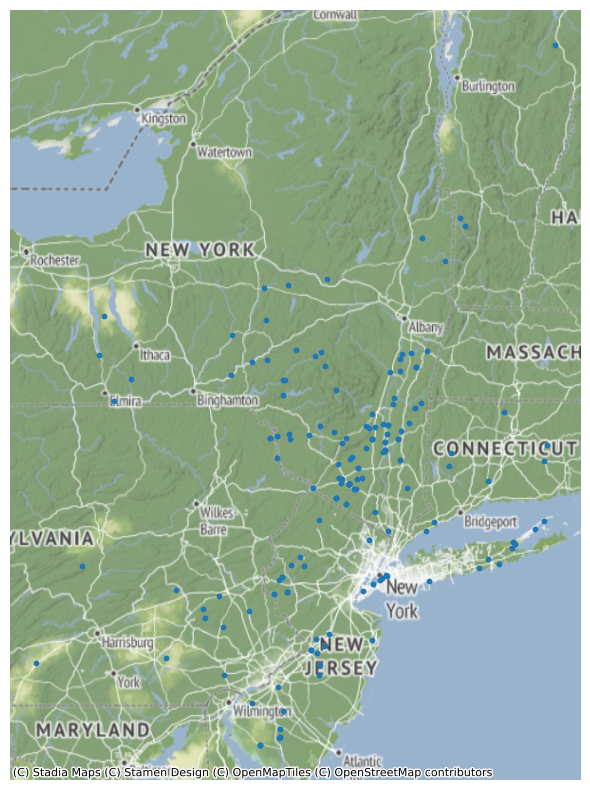

In [12]:
ax = gdf.plot(figsize=(10,10), markersize=10)
cx.add_basemap(ax=ax, crs=gdf.crs, source=provider)
ax.axis("off");

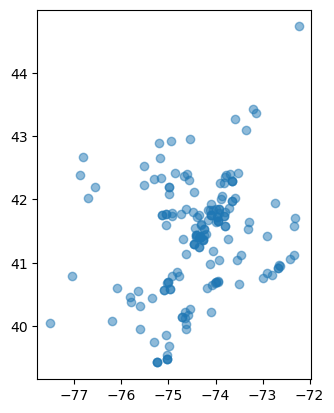

In [13]:
gdf.plot(alpha=0.5);

## Add NYS counties

Features from https://new-york-opd-geographic-information-gateway-nysdos.hub.arcgis.com/datasets/sharegisny::counties-shoreline/explore

In [14]:
gdf_nys_counties = gpd.read_file("data/NYS_Civil_Boundaries_2455759864913236436.geojson")

In [15]:
gdf_nys_counties.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

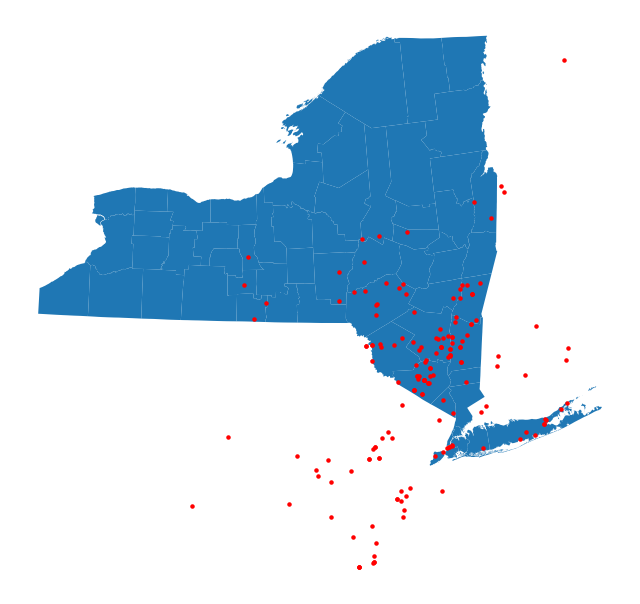

In [16]:
ax = gdf_nys_counties.to_crs(proj_nys_east).plot(figsize=(8,8))
gdf.to_crs(proj_nys_east).plot(ax=ax, color="red", markersize=5)
ax.axis("off");

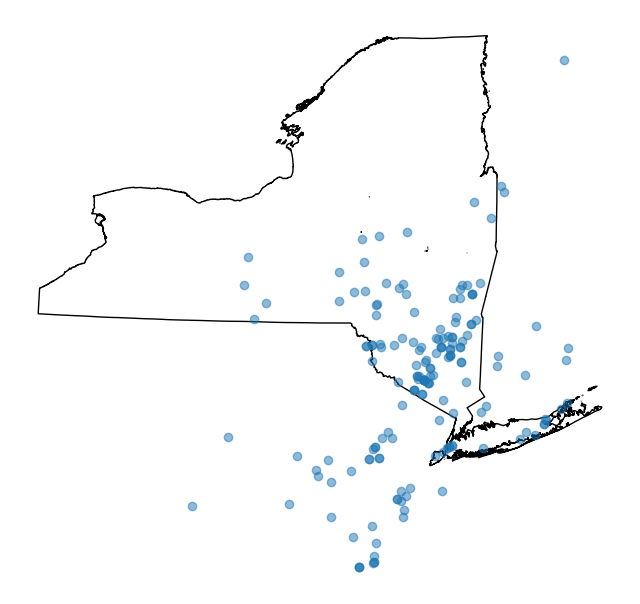

In [17]:
ax = gdf_nys_counties.to_crs(proj_nys_east).dissolve().plot(figsize=(8,8), facecolor="none", edgecolor="black")
gdf.to_crs(proj_nys_east).plot(ax=ax, alpha=0.5)
ax.axis("off");

## Refine dataset

In [19]:
gdf["x_lon"] = gdf.geometry.x
gdf["y_lat"] = gdf.geometry.y

coords_latlon = gdf[["x_lon", "y_lat"]].to_numpy()
coords_radians = np.radians(coords_latlon)

In [20]:
gdf = gdf.to_crs(proj_nys_east)
gdf["x_nys"] = gdf.geometry.x
gdf["y_nys"] = gdf.geometry.y

coords_nys = gdf[["x_nys", "y_nys"]].to_numpy()

In [21]:
gdf = gdf.to_crs(6933)

In [22]:
nys_shape = gdf_nys_counties.dissolve()

In [23]:
nys_shape = nys_shape.geometry

<Axes: >

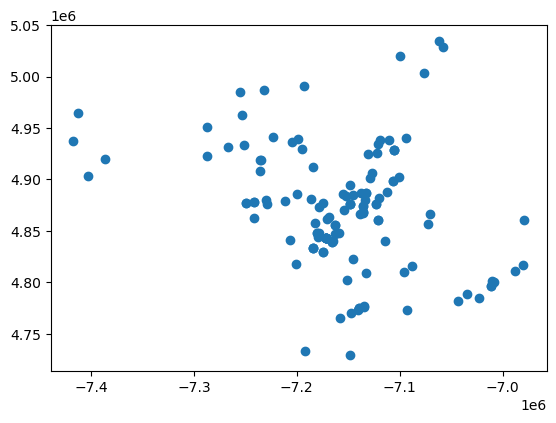

In [24]:
gdf_near_nys = gdf.clip(nys_shape.to_crs(6933).buffer(miles_to_meters(25)))
gdf_near_nys.plot()

<Axes: >

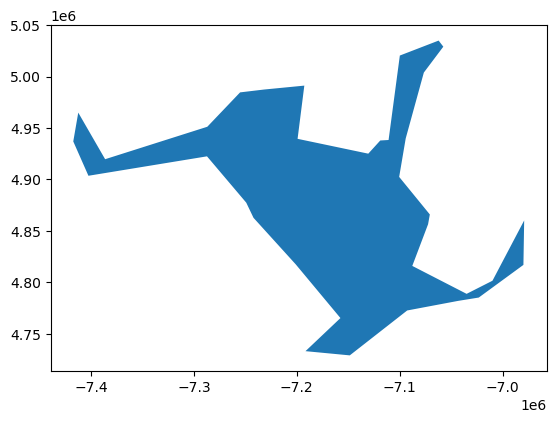

In [25]:
concave_hull = gdf_near_nys.dissolve().concave_hull(.2)
concave_hull.plot()

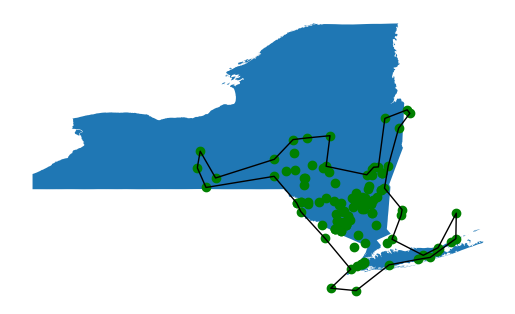

In [26]:
ax = nys_shape.to_crs(6933).plot()
gdf_near_nys.plot(ax=ax, color="green")
concave_hull.plot(ax=ax, facecolor="none", edgecolor="black")
ax.axis("off");

## Analyze point pattern

In [27]:
gdf_near_nys.crs

<Projected CRS: EPSG:6933>
Name: WGS 84 / NSIDC EASE-Grid 2.0 Global
Axis Info [cartesian]:
- X[east]: Easting (metre)
- Y[north]: Northing (metre)
Area of Use:
- name: World between 86°S and 86°N.
- bounds: (-180.0, -86.0, 180.0, 86.0)
Coordinate Operation:
- name: US NSIDC EASE-Grid 2.0 Global
- method: Lambert Cylindrical Equal Area
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [28]:
gdf.crs

<Projected CRS: EPSG:6933>
Name: WGS 84 / NSIDC EASE-Grid 2.0 Global
Axis Info [cartesian]:
- X[east]: Easting (metre)
- Y[north]: Northing (metre)
Area of Use:
- name: World between 86°S and 86°N.
- bounds: (-180.0, -86.0, 180.0, 86.0)
Coordinate Operation:
- name: US NSIDC EASE-Grid 2.0 Global
- method: Lambert Cylindrical Equal Area
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [29]:
gdf['x'] = gdf['geometry'].x
gdf['y'] = gdf['geometry'].y
coords = gdf[['x', 'y']].to_numpy()

gdf_near_nys = gdf_near_nys.copy()
gdf_near_nys['x'] = gdf_near_nys['geometry'].x
gdf_near_nys['y'] = gdf_near_nys['geometry'].y
coords_near_nys = gdf_near_nys[['x', 'y']].to_numpy()

In [30]:
farms_mean_center = ptp.centrography.mean_center(coords)
farms_euclid_median = ptp.centrography.euclidean_median(coords)
farms_manhattan_median = ptp.centrography.manhattan_median(coords)

farms_near_nys_mc = ptp.centrography.mean_center(coords_near_nys)
farms_near_nys_em = ptp.centrography.euclidean_median(coords_near_nys)
farms_near_nys_mm = ptp.centrography.manhattan_median(coords_near_nys)

c:\Users\Darcy Krasne\.conda\envs\info615\Lib\site-packages\pointpats\centrography.py:216: UserWarning: Manhattan Median is not unique for even point patterns.
  warnings.warn(s)


In [31]:
farms_mean_center = gpd.GeoDataFrame(geometry=[shapely.Point(farms_mean_center)])
farms_euclid_median = gpd.GeoDataFrame(geometry=[shapely.Point(farms_euclid_median)])
farms_manhattan_median = gpd.GeoDataFrame(geometry=[shapely.Point(farms_manhattan_median)])

farms_near_nys_mc = gpd.GeoDataFrame(geometry=[shapely.Point(farms_near_nys_mc)])
farms_near_nys_em = gpd.GeoDataFrame(geometry=[shapely.Point(farms_near_nys_em)])
farms_near_nys_mm = gpd.GeoDataFrame(geometry=[shapely.Point(farms_near_nys_mm)])


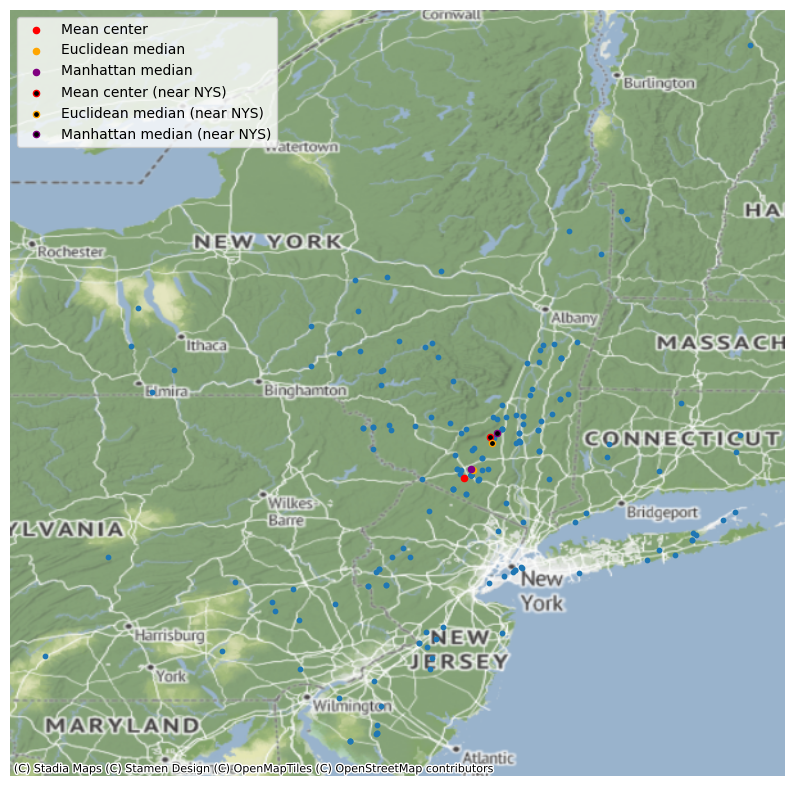

In [32]:
ax = gdf.plot(figsize=(10,10), markersize=10)
farms_mean_center.plot(ax=ax, color="red", markersize=20, label="Mean center")
farms_euclid_median.plot(ax=ax, color="orange", markersize=20, label="Euclidean median")
farms_manhattan_median.plot(ax=ax, color="purple", markersize=20, label="Manhattan median")
farms_near_nys_mc.plot(ax=ax, color="black", edgecolor="red", markersize=20, label="Mean center (near NYS)")
farms_near_nys_em.plot(ax=ax, color="black", edgecolor="orange", markersize=20, label="Euclidean median (near NYS)")
farms_near_nys_mm.plot(ax=ax, color="black", edgecolor="purple", markersize=20, label="Manhattan median (near NYS)")
cx.add_basemap(ax=ax, crs=gdf.crs, source=provider)
ax.legend()
ax.axis("off");


In [33]:
pp = ptp.PointPattern(coords)
pp.summary()

Point Pattern
172 points
Bounding rectangle [(-7479641.984967878,4650577.455065382), (-6968902.126599977,5155463.423469051)]
Area of window: 257865387994.43066
Intensity estimate for window: 6.670146828845243e-10
              x             y
0 -7.105428e+06  4.928692e+06
1 -7.259056e+06  4.650577e+06
2 -7.266427e+06  4.682237e+06
3 -7.266613e+06  4.931703e+06
4 -7.171277e+06  4.843456e+06


In [34]:
pp_near_nys = ptp.PointPattern(coords_near_nys)
pp_near_nys.summary()

Point Pattern
131 points
Bounding rectangle [(-7417218.005369625,4729069.496997746), (-6979085.008807443,5034939.054747142)]
Area of window: 134011545893.89209
Intensity estimate for window: 9.775277131996032e-10
              x             y
0 -7.191567e+06  4.733163e+06
1 -7.201095e+06  4.817547e+06
2 -7.184303e+06  4.833422e+06
3 -7.171277e+06  4.843456e+06
4 -7.171277e+06  4.843456e+06


In [35]:
print("Max. nearest neighbor distance")
print("All farms:", meters_to_miles(pp.max_nnd))
print("Farms near NYS:", meters_to_miles(pp_near_nys.max_nnd))

Max. nearest neighbor distance
All farms: 94.73208419214482
Farms near NYS: 26.857028897712382


In [36]:
print("Min. nearest neighbor distance")
print("All farms:", pp.min_nnd)
print("Farms near NYS:", pp_near_nys.min_nnd)

Min. nearest neighbor distance
All farms: 0.0
Farms near NYS: 0.0


In [37]:
print("Mean nearest neighbor distance")
print("All farms:", meters_to_miles(pp.mean_nnd))
print("Farms near NYS:", meters_to_miles(pp_near_nys.mean_nnd))

Mean nearest neighbor distance
All farms: 6.3710745735967045
Farms near NYS: 5.1036173658442


In [38]:
print("Median nearest neighbor distance")
print("All farms:", meters_to_miles(np.median(pp.nnd)))
print("Farms near NYS", meters_to_miles(np.median(pp_near_nys.nnd)))

Median nearest neighbor distance
All farms: 3.071382395754951
Farms near NYS 2.7272921498525005


In [39]:
n = 8

print(f"Median distance of {n} nearest neighbors")
print("All farms:", meters_to_miles(np.median(pp.knn(n)[1])))
print("Farms near NYS:", meters_to_miles(np.median(pp_near_nys.knn(n)[1])))

Median distance of 8 nearest neighbors
All farms: 10.413802637638327
Farms near NYS: 9.814865976706582


In [40]:
n = 8

print(f"Mean distance of {n} nearest neighbors")
print("All farms:", meters_to_miles(np.mean(pp.knn(n)[1])))
print("Farms near NYS:", meters_to_miles(np.mean(pp_near_nys.knn(n)[1])))

Mean distance of 8 nearest neighbors
All farms: 16.23935451362277
Farms near NYS: 14.450527298048724


## Analyze Clustering

In [41]:
null_hypothesis_mean_nnd = 0.5 * np.sqrt(concave_hull.area.sum() / pp_near_nys.n)
nni = pp_near_nys.mean_nnd / null_hypothesis_mean_nnd
print("Mean nearest neighbor distance:", pp_near_nys.mean_nnd)
print("Null hypothesis nearest neighbor distance", null_hypothesis_mean_nnd)
print("Nearest neighbor index", nni)

Mean nearest neighbor distance: 8211.720341643319
Null hypothesis nearest neighbor distance 8416.711874584675
Nearest neighbor index 0.9756447011617025


Since the mean nearest neighbor index is (slightly) lower than 1, the farms within 25 miles of NYS exhibit slight clustering.

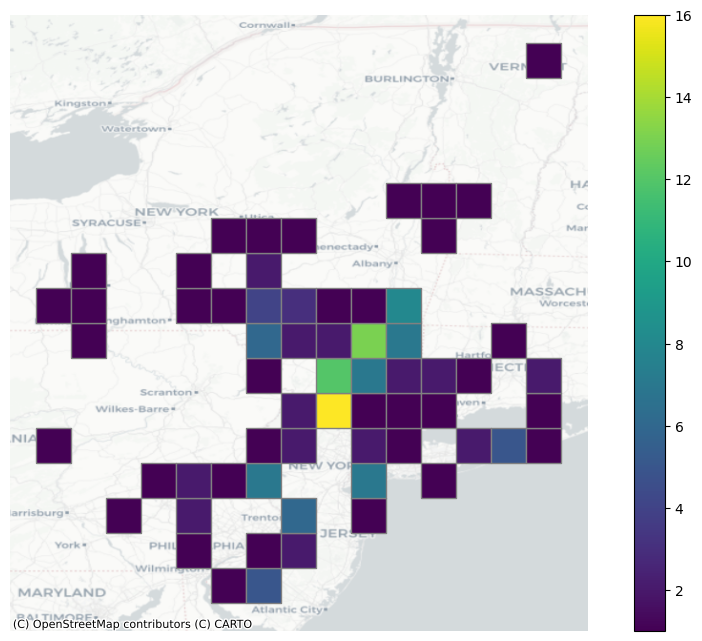

np.float64(2.6404456816123375e-21)

In [42]:
grid_sq_all_farms = make_square_grid(gdf, miles_to_meters(20))
r = rasterize(gdf, grid_sq_all_farms)
stats.chisquare(r['count']).pvalue

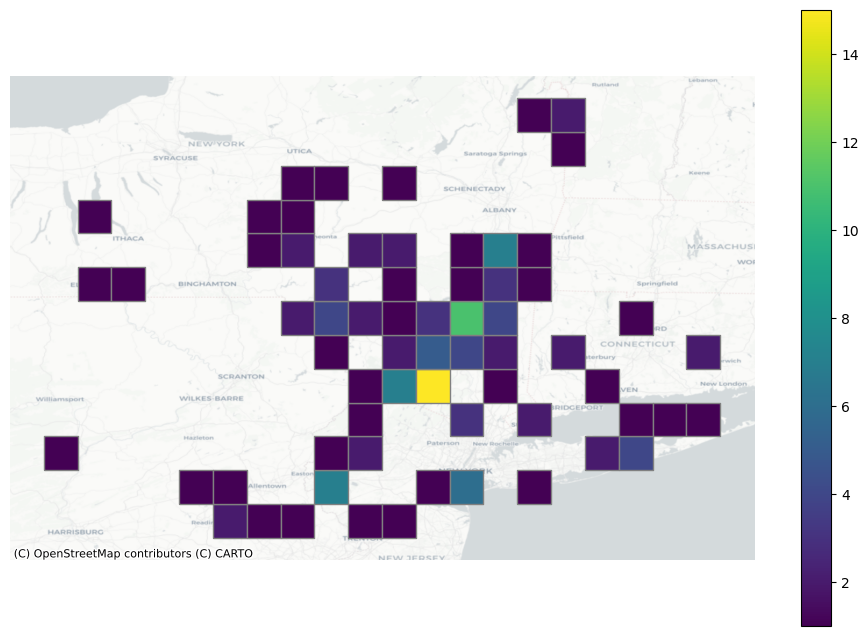

np.float64(5.212863598584674e-12)

In [43]:
grid_sq_farms_near_nys = make_square_grid(gdf_near_nys, miles_to_meters(15))
r = rasterize(gdf, grid_sq_farms_near_nys)
stats.chisquare(r['count']).pvalue

In [44]:
g_test = ptp.distance_statistics.g_test(coords_near_nys, support=40, keep_simulations=True, n_simulations=99)

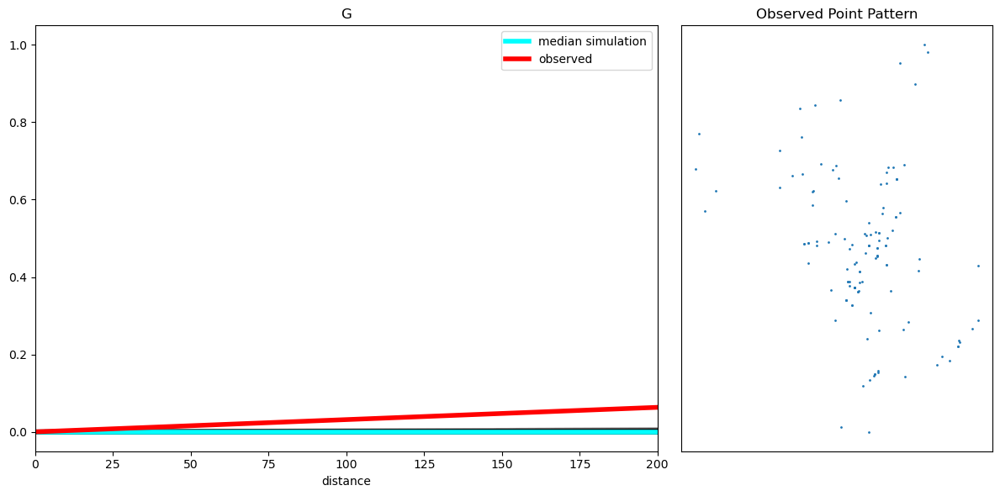

In [45]:
plot_test_results(g_test, coords_near_nys)

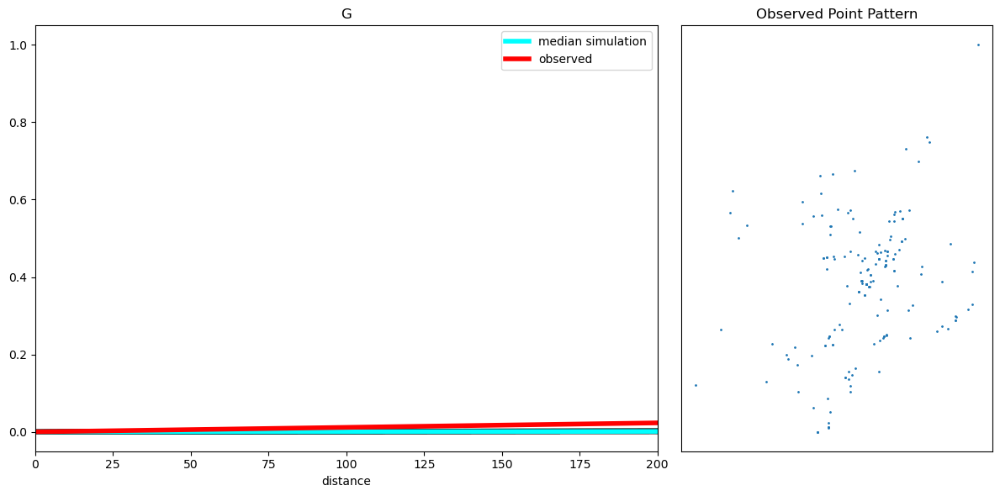

In [46]:
g_test_all = ptp.distance_statistics.g_test(coords, support=40, keep_simulations=True, n_simulations=99)
plot_test_results(g_test_all, coords)

In [47]:
f_test = ptp.distance_statistics.f_test(coords_near_nys, support=40, keep_simulations=True, n_simulations=99)

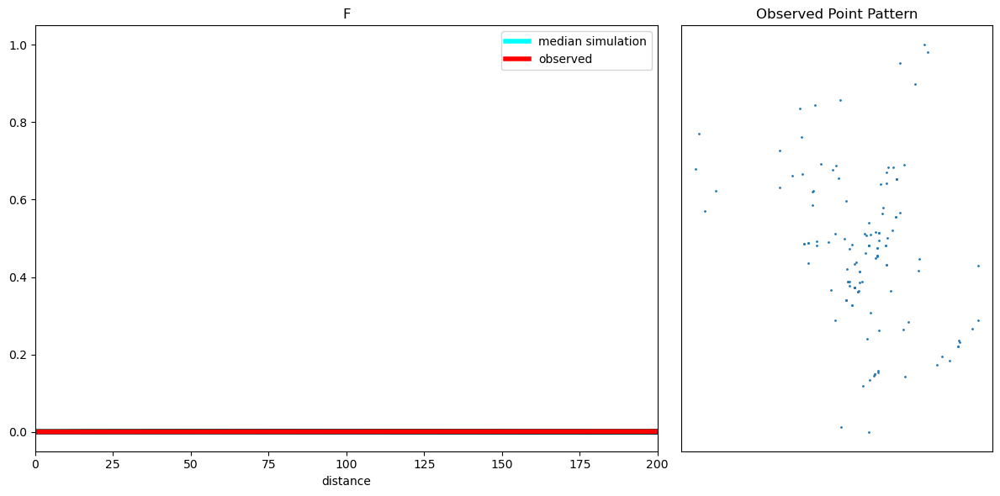

In [48]:
plot_test_results(f_test, coords_near_nys)

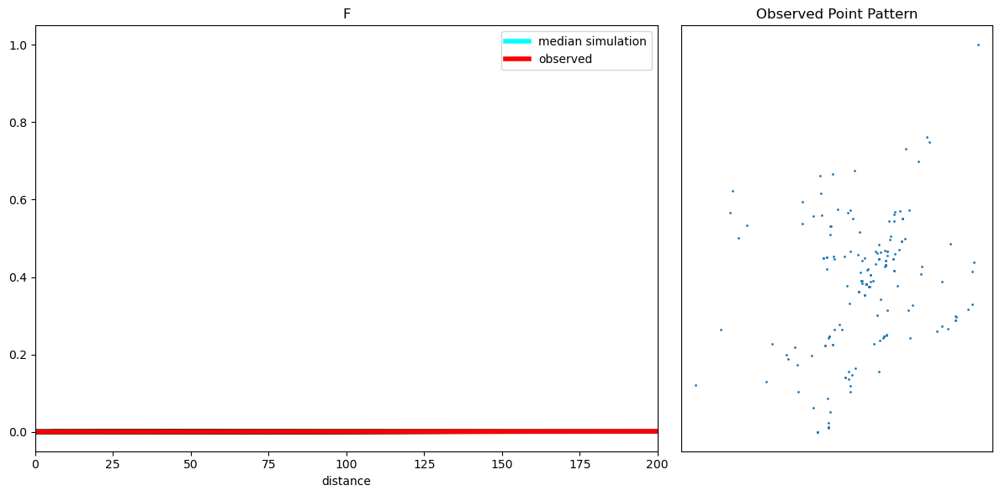

In [49]:
f_test_all = ptp.distance_statistics.f_test(coords, support=40, keep_simulations=True, n_simulations=99)
plot_test_results(f_test_all, coords)

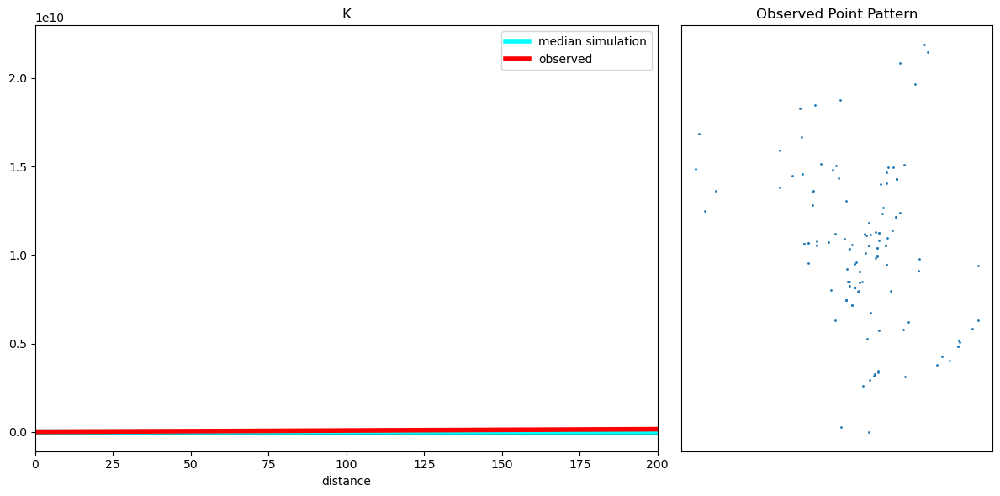

In [50]:
k_test = ptp.distance_statistics.k_test(coords_near_nys, support=40, keep_simulations=True, n_simulations=99)
plot_test_results(k_test, coords_near_nys)

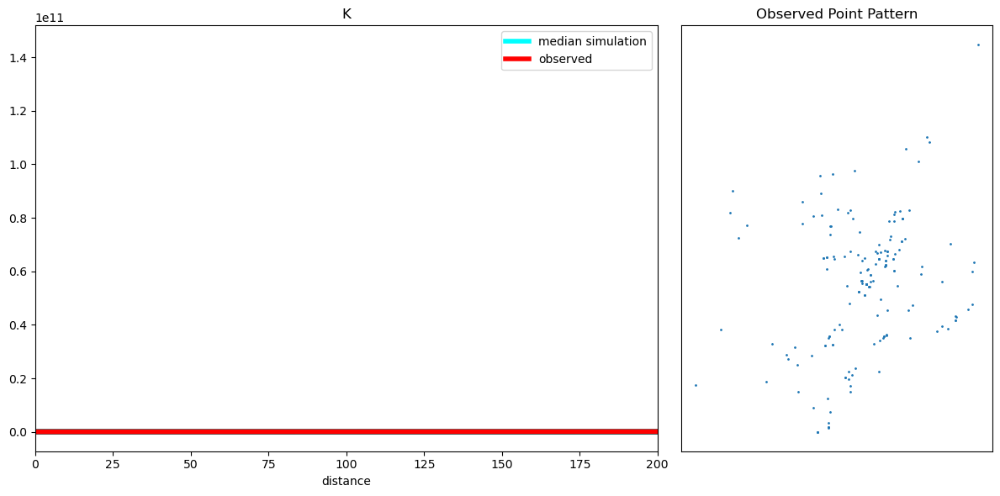

In [51]:
k_test_all = ptp.distance_statistics.k_test(coords, support=40, keep_simulations=True, n_simulations=99)
plot_test_results(k_test_all, coords)

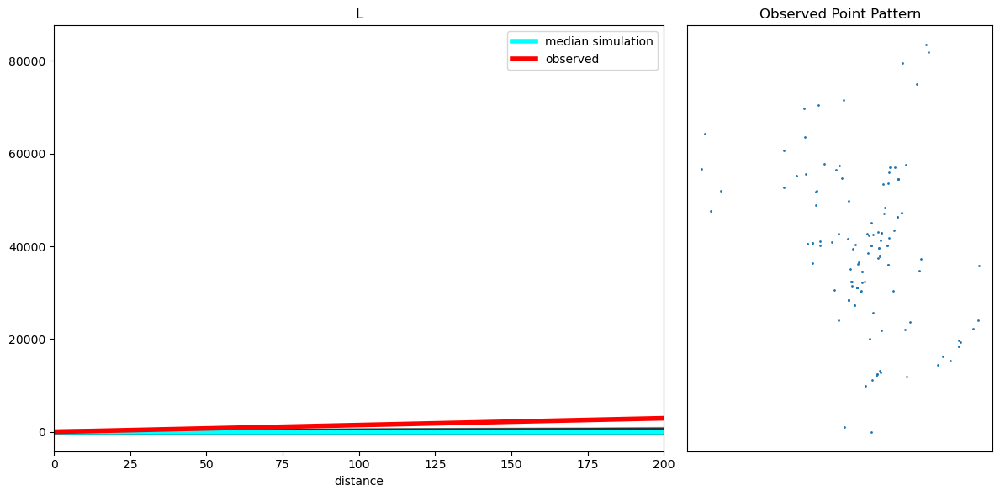

In [52]:
l_test = ptp.distance_statistics.l_test(coords_near_nys, support=40, keep_simulations=True, n_simulations=99)
plot_test_results(l_test, coords_near_nys)

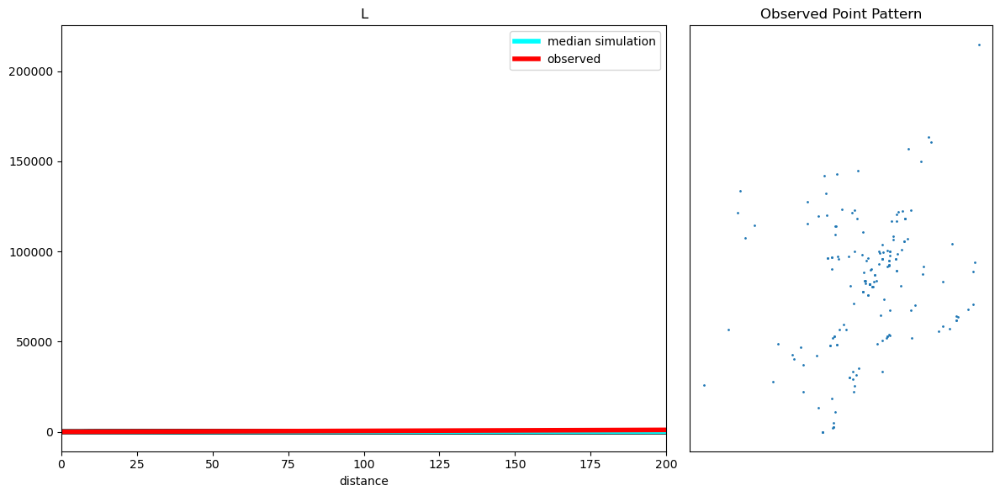

In [53]:
l_test_all = ptp.distance_statistics.l_test(coords, support=40, keep_simulations=True, n_simulations=99)
plot_test_results(l_test_all, coords)

## Analyze spatial autocorrelation

In [54]:
hex_grid = make_hex_grid(gdf, resolution=4)
sq_grid = make_square_grid(gdf, cell_side=miles_to_meters(13))

c:\Users\Darcy Krasne\.conda\envs\info615\Lib\site-packages\pyproj\crs\crs.py:1295: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)


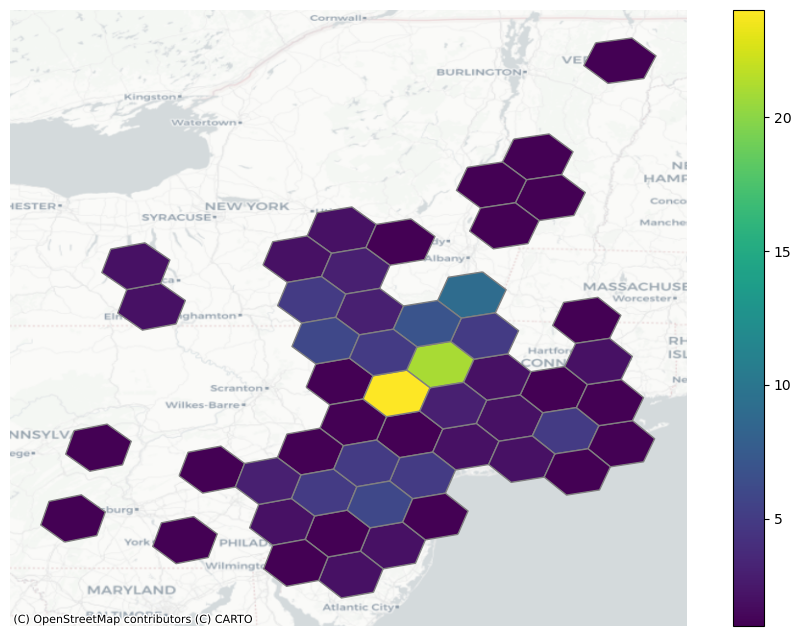

In [55]:
farms_agg_hex = rasterize(gdf, hex_grid)

In [56]:
w = weights.DistanceBand.from_dataframe(farms_agg_hex, threshold=miles_to_meters(60))
w.transform = 'R'

('WARNING: ', '842bab1ffffffff', ' is an island (no neighbors)')


c:\Users\Darcy Krasne\.conda\envs\info615\Lib\site-packages\libpysal\weights\util.py:826: UserWarning: The weights matrix is not fully connected: 
 There are 4 disconnected components.
 There is 1 island with id: 842bab1ffffffff.
  w = W(neighbors, weights, ids, **kwargs)
c:\Users\Darcy Krasne\.conda\envs\info615\Lib\site-packages\libpysal\weights\distance.py:844: UserWarning: The weights matrix is not fully connected: 
 There are 4 disconnected components.
 There is 1 island with id: 842bab1ffffffff.
  W.__init__(


In [57]:
moran = esda.moran.Moran(farms_agg_hex['count'], w, permutations=9999)

In [58]:
moran.I

np.float64(0.12923263963956388)

In [59]:
moran.p_sim

np.float64(0.0269)

In [60]:
float(moran.p_sim) > 0.05

False

In [61]:
local_moran = esda.moran.Moran_Local(farms_agg_hex['count'], w)

c:\Users\Darcy Krasne\.conda\envs\info615\Lib\site-packages\mapclassify\classifiers.py:1653: UserWarning: Not enough unique values in array to form 5 classes. Setting k to 4.
  self.bins = quantile(y, k=k)


(<Figure size 1500x400 with 3 Axes>,
 array([<Axes: title={'center': 'Moran Local Scatterplot'}, xlabel='Attribute', ylabel='Spatial Lag'>,
        <Axes: >, <Axes: >], dtype=object))

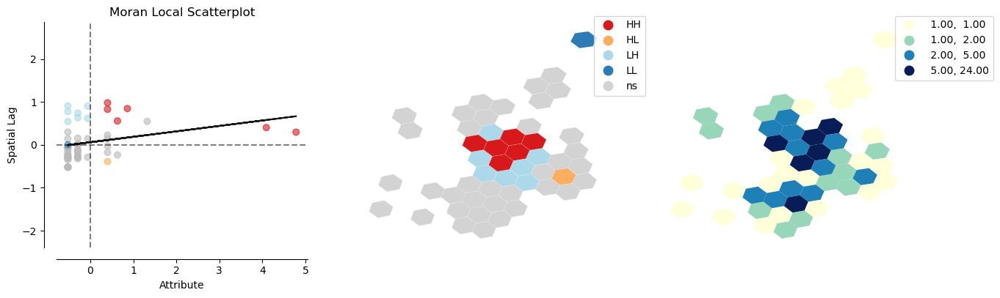

In [62]:
plot_local_autocorrelation(local_moran, farms_agg_hex, 'count', p=0.05)

In [63]:
farms_agg_hex = farms_agg_hex.copy()
farms_agg_hex['local_moran_Is'] = local_moran.Is
farms_agg_hex['local_moran_p_value'] = local_moran.p_sim
farms_agg_hex['local_moran_quadrant'] = local_moran.q

In [64]:
alpha = 0.05
hotspots = farms_agg_hex.query(f"local_moran_p_value < {alpha} and local_moran_quadrant == 1")
hotspots_almost = farms_agg_hex.query(f"local_moran_p_value >= {alpha} and local_moran_p_value < {alpha + 0.01} and local_moran_quadrant == 1")
doughnuts = farms_agg_hex.query(f"local_moran_p_value < {alpha} and local_moran_quadrant == 2")
coldspots = farms_agg_hex.query(f"local_moran_p_value < {alpha} and local_moran_quadrant == 3")
diamonds = farms_agg_hex.query(f"local_moran_p_value < {alpha} and local_moran_quadrant == 4")

C:\Users\Darcy Krasne\AppData\Local\Temp\ipykernel_14908\2958855543.py:9: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  ax.legend()


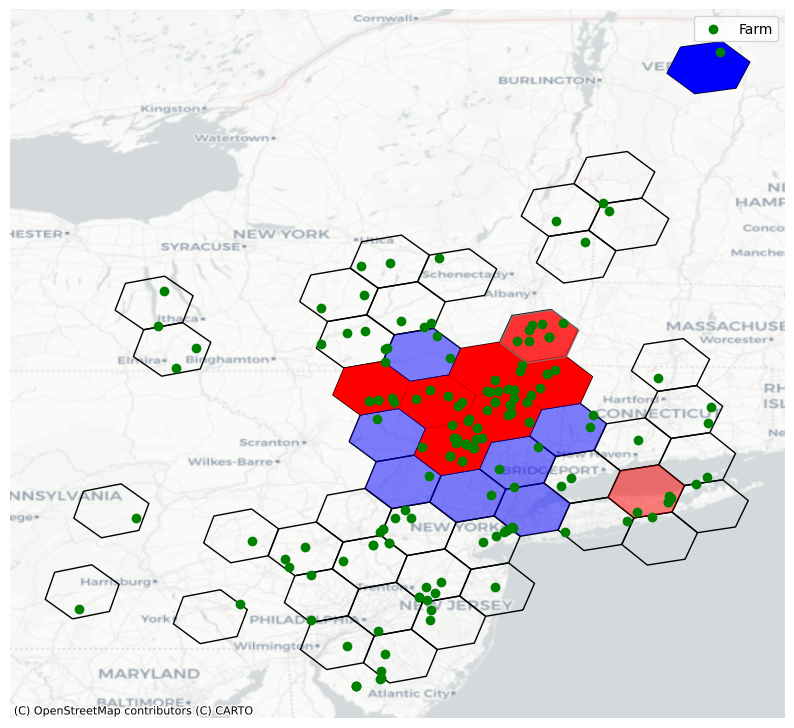

In [65]:
ax = farms_agg_hex.plot(figsize=(10,10), facecolor="none")
hotspots.plot(ax=ax, facecolor="red", label="Hotspots")
hotspots_almost.plot(ax=ax, facecolor="red", alpha=0.8, edgecolor="grey", label=f"Almost Hotspots (alpha = {alpha + 0.01})")
diamonds.plot(ax=ax, facecolor="red", alpha=0.5, label="Diamonds")
doughnuts.plot(ax=ax, facecolor="blue", alpha=0.5, label="Doughnuts")
coldspots.plot(ax=ax, facecolor="blue", label="Coldspots")
gdf.plot(ax=ax, color="green", label="Farm")
cx.add_basemap(ax=ax, crs=farms_agg_hex.crs, source=cx.providers.CartoDB.Positron)
ax.legend()
ax.axis("off");

In [66]:
hotspots

,geometry,count,local_moran_Is,local_moran_p_value,local_moran_quadrant
index,,,,,
842a16bffffffff,"POLYGON ((-7151615.651 4844557.658, -7121005.5...",21.0,1.613388,0.013,1
842a163ffffffff,"POLYGON ((-7191333.129 4818223.23, -7160936.46...",24.0,1.381763,0.011,1
842a145ffffffff,"POLYGON ((-7092047.483 4912972.739, -7123121.8...",5.0,0.385965,0.003,1
842a169ffffffff,"POLYGON ((-7185084.391 4898023.024, -7163566.3...",7.0,0.714487,0.003,1
842a165ffffffff,"POLYGON ((-7268644.535 4903569.239, -7277536.6...",6.0,0.344932,0.039,1
842a161ffffffff,"POLYGON ((-7185084.391 4898023.024, -7215969.0...",5.0,0.326517,0.001,1


In [67]:
hotspots_almost

,geometry,count,local_moran_Is,local_moran_p_value,local_moran_quadrant
index,,,,,
842b893ffffffff,"POLYGON ((-7103671.007 4950284.746, -7135000.3...",9.0,0.709422,0.054,1


In [68]:
gdf_farms_moran_cluster = gpd.GeoDataFrame(pd.concat([hotspots, hotspots_almost]))
gdf_farms_moran_cluster

,geometry,count,local_moran_Is,local_moran_p_value,local_moran_quadrant
index,,,,,
842a16bffffffff,"POLYGON ((-7151615.651 4844557.658, -7121005.5...",21.0,1.613388,0.013,1
842a163ffffffff,"POLYGON ((-7191333.129 4818223.23, -7160936.46...",24.0,1.381763,0.011,1
842a145ffffffff,"POLYGON ((-7092047.483 4912972.739, -7123121.8...",5.0,0.385965,0.003,1
842a169ffffffff,"POLYGON ((-7185084.391 4898023.024, -7163566.3...",7.0,0.714487,0.003,1
842a165ffffffff,"POLYGON ((-7268644.535 4903569.239, -7277536.6...",6.0,0.344932,0.039,1
842a161ffffffff,"POLYGON ((-7185084.391 4898023.024, -7215969.0...",5.0,0.326517,0.001,1
842b893ffffffff,"POLYGON ((-7103671.007 4950284.746, -7135000.3...",9.0,0.709422,0.054,1


Since there are two hexagons that fluctuate between just above and just below 0.05 significance depending on the run, I capture "almost" significant hotspots as well as significant hotspots.

EPSG:6933
('WARNING: ', 287, ' is an island (no neighbors)')


c:\Users\Darcy Krasne\.conda\envs\info615\Lib\site-packages\libpysal\weights\util.py:826: UserWarning: The weights matrix is not fully connected: 
 There are 2 disconnected components.
 There is 1 island with id: 287.
  w = W(neighbors, weights, ids, **kwargs)
c:\Users\Darcy Krasne\.conda\envs\info615\Lib\site-packages\libpysal\weights\distance.py:844: UserWarning: The weights matrix is not fully connected: 
 There are 2 disconnected components.
 There is 1 island with id: 287.
  W.__init__(


Moran's I: 0.12011725565340946
p-value: 0.0187


C:\Users\Darcy Krasne\AppData\Local\Temp\ipykernel_14908\3661215329.py:53: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  ax.legend()


,geometry,count,local_moran_Is,local_moran_p_value,local_moran_quadrant
index,,,,,
38,"POLYGON ((-7447461.985 4779297.455, -7447461.9...",1.0,0.279582,0.001,3
42,"POLYGON ((-7447461.985 4908017.455, -7447461.9...",1.0,0.279582,0.001,3
58,"POLYGON ((-7415281.985 4875837.455, -7415281.9...",1.0,0.279582,0.001,3
59,"POLYGON ((-7415281.985 4908017.455, -7415281.9...",1.0,0.279582,0.001,3
60,"POLYGON ((-7415281.985 4940197.455, -7415281.9...",1.0,0.279582,0.001,3
...,...,...,...,...,...
262,"POLYGON ((-7029121.985 4875837.455, -7029121.9...",1.0,-0.007988,0.427,2
276,"POLYGON ((-6996941.985 4779297.455, -6996941.9...",1.0,0.078283,0.440,3
277,"POLYGON ((-6996941.985 4811477.455, -6996941.9...",1.0,0.135797,0.232,3


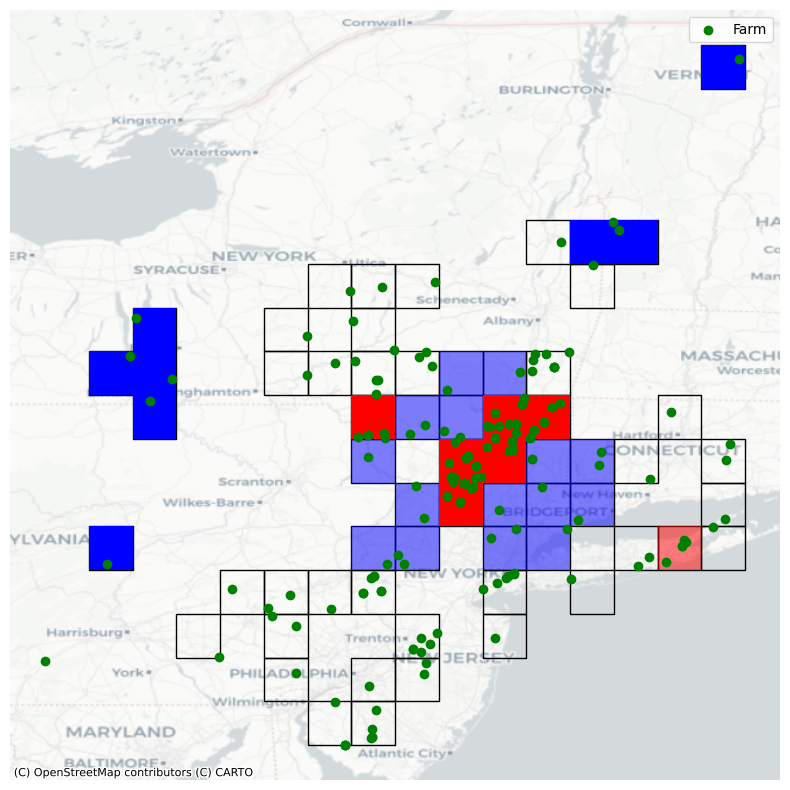

In [69]:
plot_moran_geo(gdf, "square", miles_to_meters(20), threshold=miles_to_meters(60))

In [70]:
plot_moran_geo(gdf_near_nys, "square", miles_to_meters(15), threshold=miles_to_meters(60))

EPSG:6933


c:\Users\Darcy Krasne\.conda\envs\info615\Lib\site-packages\libpysal\weights\util.py:826: UserWarning: The weights matrix is not fully connected: 
 There are 2 disconnected components.
  w = W(neighbors, weights, ids, **kwargs)
c:\Users\Darcy Krasne\.conda\envs\info615\Lib\site-packages\libpysal\weights\distance.py:844: UserWarning: The weights matrix is not fully connected: 
 There are 2 disconnected components.
  W.__init__(


'There is no spatial autocorrelation.'

In [71]:
plot_moran_geo(gdf_near_nys, "square", miles_to_meters(20), threshold=miles_to_meters(60))

EPSG:6933


c:\Users\Darcy Krasne\.conda\envs\info615\Lib\site-packages\libpysal\weights\util.py:826: UserWarning: The weights matrix is not fully connected: 
 There are 2 disconnected components.
  w = W(neighbors, weights, ids, **kwargs)
c:\Users\Darcy Krasne\.conda\envs\info615\Lib\site-packages\libpysal\weights\distance.py:844: UserWarning: The weights matrix is not fully connected: 
 There are 2 disconnected components.
  W.__init__(


'There is no spatial autocorrelation.'

## Analyze by county and tract

In [72]:
gdf_nys_counties = gdf_nys_counties.to_crs(6933)
county_cts = gdf_nys_counties.copy().sjoin(gdf_near_nys, how="left", predicate="contains").groupby("FIPS_CODE").x.count().reset_index().rename(columns={'x': 'count'})
gdf_nys_counties_farm_cts = gdf_nys_counties.copy().merge(county_cts, on="FIPS_CODE")
gdf_nys_counties_farm_cts["area"] = gdf_nys_counties_farm_cts["geometry"].area
gdf_nys_counties_farm_cts["ct_per_mi"] = meters_to_miles(gdf_nys_counties_farm_cts["count"]/gdf_nys_counties_farm_cts["area"])
gdf_nys_counties_farm_cts.head()

,OBJECTID,NAME,ABBREV,GNIS_ID,FIPS_CODE,SWIS,NYSP_ZONE,POP1990,POP2000,POP2010,POP2020,DOS_LL,DOSLL_DATE,NYC,CALC_SQ_MI,DATEMOD,geometry,count,area,ct_per_mi
0,1,Albany,ALBA,974099,36001,010000,East,292594,294565,304204,314848,None,None,N,532.791779,"Fri, 10 Nov 2017 00:00:00 GMT","POLYGON ((-7108814.192 4975014.51, -7108846.68...",0,1.380785e+09,0.0
1,2,Allegany,ALLE,974100,36003,020000,West,50470,49927,48946,46456,None,None,N,1035.209131,"Fri, 26 Apr 2019 00:00:00 GMT","POLYGON ((-7529900.58 4950223.631, -7529900.97...",0,2.679201e+09,0.0
2,3,Bronx,BRON,974101,36005,600000,Long Island,1203789,1332650,1385108,1472654,None,None,Y,41.933548,"Fri, 04 Oct 2019 00:00:00 GMT","MULTIPOLYGON (((-7130053.535 4784834.466, -713...",0,1.086698e+08,0.0
3,4,Broome,BROO,974102,36007,030000,Central,212160,200536,200600,198683,None,None,N,715.287465,"Fri, 26 Apr 2019 00:00:00 GMT","POLYGON ((-7276850.042 4919323.294, -7276858.8...",0,1.853850e+09,0.0
4,5,Cattaraugus,CATT,974103,36009,040000,West,84234,83955,80317,77042,None,None,N,1324.309219,"Fri, 26 Apr 2019 00:00:00 GMT","POLYGON ((-7570690.277 4951693.305, -7570688.1...",0,3.424895e+09,0.0


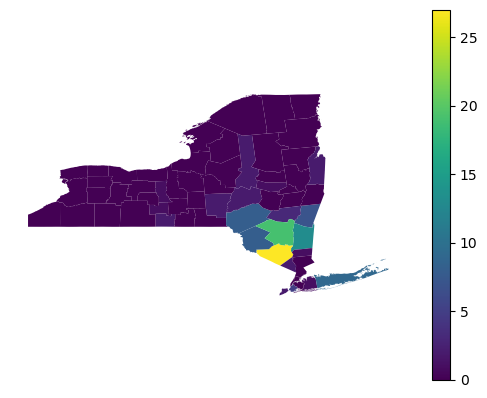

In [73]:
gdf_nys_counties_farm_cts.plot(column="count", legend=True).axis("off");

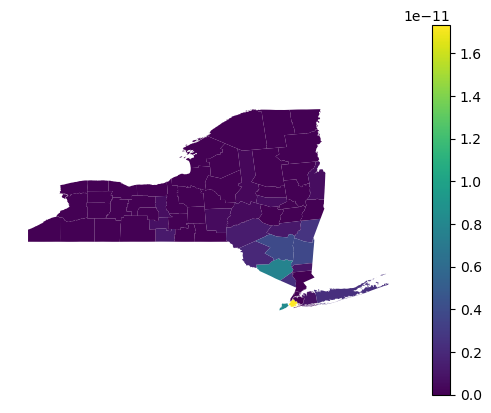

In [74]:
gdf_nys_counties_farm_cts.plot(column="ct_per_mi", legend=True).axis("off");

c:\Users\Darcy Krasne\.conda\envs\info615\Lib\site-packages\libpysal\weights\util.py:826: UserWarning: The weights matrix is not fully connected: 
 There are 43 disconnected components.
 There are 37 islands with ids: 1, 3, 4, 6, 8, 9, 10, 11, 12, 13, 14, 15, 16, 19, 20, 21, 22, 24, 25, 26, 27, 31, 32, 33, 35, 37, 38, 41, 44, 49, 50, 51, 52, 55, 56, 57, 58.
  w = W(neighbors, weights, ids, **kwargs)
c:\Users\Darcy Krasne\.conda\envs\info615\Lib\site-packages\libpysal\weights\distance.py:844: UserWarning: The weights matrix is not fully connected: 
 There are 43 disconnected components.
 There are 37 islands with ids: 1, 3, 4, 6, 8, 9, 10, 11, 12, 13, 14, 15, 16, 19, 20, 21, 22, 24, 25, 26, 27, 31, 32, 33, 35, 37, 38, 41, 44, 49, 50, 51, 52, 55, 56, 57, 58.
  W.__init__(


('WARNING: ', 1, ' is an island (no neighbors)')
('WARNING: ', 3, ' is an island (no neighbors)')
('WARNING: ', 4, ' is an island (no neighbors)')
('WARNING: ', 6, ' is an island (no neighbors)')
('WARNING: ', 8, ' is an island (no neighbors)')
('WARNING: ', 9, ' is an island (no neighbors)')
('WARNING: ', 10, ' is an island (no neighbors)')
('WARNING: ', 11, ' is an island (no neighbors)')
('WARNING: ', 12, ' is an island (no neighbors)')
('WARNING: ', 13, ' is an island (no neighbors)')
('WARNING: ', 14, ' is an island (no neighbors)')
('WARNING: ', 15, ' is an island (no neighbors)')
('WARNING: ', 16, ' is an island (no neighbors)')
('WARNING: ', 19, ' is an island (no neighbors)')
('WARNING: ', 20, ' is an island (no neighbors)')
('WARNING: ', 21, ' is an island (no neighbors)')
('WARNING: ', 22, ' is an island (no neighbors)')
('WARNING: ', 24, ' is an island (no neighbors)')
('WARNING: ', 25, ' is an island (no neighbors)')
('WARNING: ', 26, ' is an island (no neighbors)')
('WARN

C:\Users\Darcy Krasne\AppData\Local\Temp\ipykernel_14908\3661215329.py:53: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  ax.legend()
C:\Users\Darcy Krasne\AppData\Local\Temp\ipykernel_14908\3661215329.py:53: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


,OBJECTID,NAME,ABBREV,GNIS_ID,FIPS_CODE,SWIS,NYSP_ZONE,POP1990,POP2000,POP2010,...,NYC,CALC_SQ_MI,DATEMOD,geometry,count,area,ct_per_mi,local_moran_Is,local_moran_p_value,local_moran_quadrant
0,1,Albany,ALBA,974099,36001,010000,East,292594,294565,304204,...,N,532.791779,"Fri, 10 Nov 2017 00:00:00 GMT","POLYGON ((-7108814.192 4975014.51, -7108846.68...",0,1.380785e+09,0.000000e+00,0.130273,0.344,3
1,2,Allegany,ALLE,974100,36003,020000,West,50470,49927,48946,...,N,1035.209131,"Fri, 26 Apr 2019 00:00:00 GMT","POLYGON ((-7529900.58 4950223.631, -7529900.97...",0,2.679201e+09,0.000000e+00,-0.000000,0.001,3
2,3,Bronx,BRON,974101,36005,600000,Long Island,1203789,1332650,1385108,...,Y,41.933548,"Fri, 04 Oct 2019 00:00:00 GMT","MULTIPOLYGON (((-7130053.535 4784834.466, -713...",0,1.086698e+08,0.000000e+00,-0.362520,0.037,2
3,4,Broome,BROO,974102,36007,030000,Central,212160,200536,200600,...,N,715.287465,"Fri, 26 Apr 2019 00:00:00 GMT","POLYGON ((-7276850.042 4919323.294, -7276858.8...",0,1.853850e+09,0.000000e+00,-0.000000,0.001,3
4,5,Cattaraugus,CATT,974103,36009,040000,West,84234,83955,80317,...,N,1324.309219,"Fri, 26 Apr 2019 00:00:00 GMT","POLYGON ((-7570690.277 4951693.305, -7570688.1...",0,3.424895e+09,0.000000e+00,-0.000000,0.001,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
57,58,Washington,WASH,974155,36115,530000,East,59330,61042,63216,...,N,840.930564,"Fri, 10 Nov 2017 00:00:00 GMT","MULTIPOLYGON (((-7082045.797 5047817.15, -7082...",2,2.178874e+09,5.704819e-13,-0.000000,0.001,3
58,59,Wayne,WAYN,974156,36117,540000,Central,89123,93765,93772,...,N,612.002795,"Thu, 08 Feb 2018 00:00:00 GMT","POLYGON ((-7402633.153 5027560.685, -7402626.5...",0,1.585279e+09,0.000000e+00,-0.000000,0.001,3
59,60,Westchester,WEST,974157,36119,550000,East,874866,923459,949113,...,N,473.245006,"Fri, 04 Oct 2019 00:00:00 GMT","MULTIPOLYGON (((-7117383.241 4792820.161, -711...",0,1.226347e+09,0.000000e+00,-0.022557,0.290,2
60,61,Wyoming,WYOM,974158,36121,560000,West,42507,43424,42155,...,N,596.822633,"Thu, 20 Sep 2018 00:00:00 GMT","POLYGON ((-7570736.634 4982914.134, -7570726.7...",0,1.544343e+09,0.000000e+00,0.130273,0.341,3


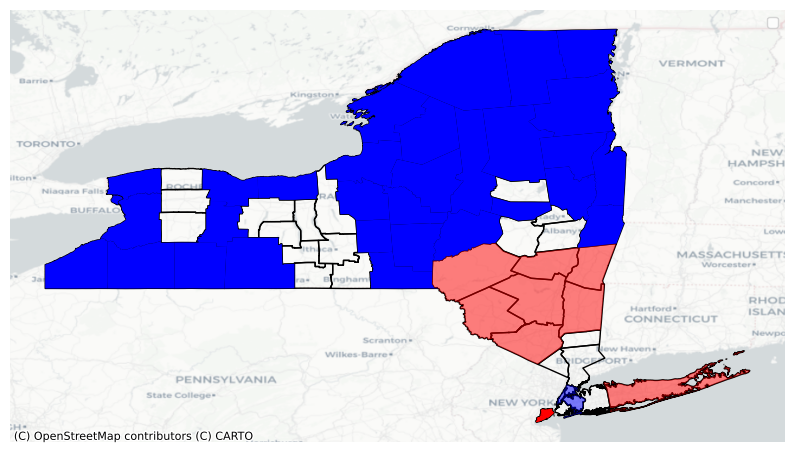

In [75]:
plot_moran_geo(gdf_nys_counties_farm_cts, count_col="ct_per_mi", plot_grid=False, threshold=miles_to_meters(20))

c:\Users\Darcy Krasne\.conda\envs\info615\Lib\site-packages\libpysal\weights\util.py:826: UserWarning: The weights matrix is not fully connected: 
 There are 16 disconnected components.
 There are 12 islands with ids: 4, 6, 9, 15, 16, 20, 21, 22, 24, 49, 51, 52.
  w = W(neighbors, weights, ids, **kwargs)
c:\Users\Darcy Krasne\.conda\envs\info615\Lib\site-packages\libpysal\weights\distance.py:844: UserWarning: The weights matrix is not fully connected: 
 There are 16 disconnected components.
 There are 12 islands with ids: 4, 6, 9, 15, 16, 20, 21, 22, 24, 49, 51, 52.
  W.__init__(


('WARNING: ', 4, ' is an island (no neighbors)')
('WARNING: ', 6, ' is an island (no neighbors)')
('WARNING: ', 9, ' is an island (no neighbors)')
('WARNING: ', 15, ' is an island (no neighbors)')
('WARNING: ', 16, ' is an island (no neighbors)')
('WARNING: ', 20, ' is an island (no neighbors)')
('WARNING: ', 21, ' is an island (no neighbors)')
('WARNING: ', 22, ' is an island (no neighbors)')
('WARNING: ', 24, ' is an island (no neighbors)')
('WARNING: ', 49, ' is an island (no neighbors)')
('WARNING: ', 51, ' is an island (no neighbors)')
('WARNING: ', 52, ' is an island (no neighbors)')
Moran's I: 0.2301893992950637
p-value: 0.0248


C:\Users\Darcy Krasne\AppData\Local\Temp\ipykernel_14908\3661215329.py:53: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  ax.legend()
C:\Users\Darcy Krasne\AppData\Local\Temp\ipykernel_14908\3661215329.py:53: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


,OBJECTID,NAME,ABBREV,GNIS_ID,FIPS_CODE,SWIS,NYSP_ZONE,POP1990,POP2000,POP2010,...,NYC,CALC_SQ_MI,DATEMOD,geometry,count,area,ct_per_mi,local_moran_Is,local_moran_p_value,local_moran_quadrant
0,1,Albany,ALBA,974099,36001,010000,East,292594,294565,304204,...,N,532.791779,"Fri, 10 Nov 2017 00:00:00 GMT","POLYGON ((-7108814.192 4975014.51, -7108846.68...",0,1.380785e+09,0.000000e+00,0.030328,0.420,3
1,2,Allegany,ALLE,974100,36003,020000,West,50470,49927,48946,...,N,1035.209131,"Fri, 26 Apr 2019 00:00:00 GMT","POLYGON ((-7529900.58 4950223.631, -7529900.97...",0,2.679201e+09,0.000000e+00,0.130273,0.341,3
2,3,Bronx,BRON,974101,36005,600000,Long Island,1203789,1332650,1385108,...,Y,41.933548,"Fri, 04 Oct 2019 00:00:00 GMT","MULTIPOLYGON (((-7130053.535 4784834.466, -713...",0,1.086698e+08,0.000000e+00,-0.429694,0.007,2
3,4,Broome,BROO,974102,36007,030000,Central,212160,200536,200600,...,N,715.287465,"Fri, 26 Apr 2019 00:00:00 GMT","POLYGON ((-7276850.042 4919323.294, -7276858.8...",0,1.853850e+09,0.000000e+00,0.106128,0.338,3
4,5,Cattaraugus,CATT,974103,36009,040000,West,84234,83955,80317,...,N,1324.309219,"Fri, 26 Apr 2019 00:00:00 GMT","POLYGON ((-7570690.277 4951693.305, -7570688.1...",0,3.424895e+09,0.000000e+00,-0.000000,0.001,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
57,58,Washington,WASH,974155,36115,530000,East,59330,61042,63216,...,N,840.930564,"Fri, 10 Nov 2017 00:00:00 GMT","MULTIPOLYGON (((-7082045.797 5047817.15, -7082...",2,2.178874e+09,5.704819e-13,0.052912,0.001,3
58,59,Wayne,WAYN,974156,36117,540000,Central,89123,93765,93772,...,N,612.002795,"Thu, 08 Feb 2018 00:00:00 GMT","POLYGON ((-7402633.153 5027560.685, -7402626.5...",0,1.585279e+09,0.000000e+00,0.088603,0.447,3
59,60,Westchester,WEST,974157,36119,550000,East,874866,923459,949113,...,N,473.245006,"Fri, 04 Oct 2019 00:00:00 GMT","MULTIPOLYGON (((-7117383.241 4792820.161, -711...",0,1.226347e+09,0.000000e+00,0.035103,0.445,3
60,61,Wyoming,WYOM,974158,36121,560000,West,42507,43424,42155,...,N,596.822633,"Thu, 20 Sep 2018 00:00:00 GMT","POLYGON ((-7570736.634 4982914.134, -7570726.7...",0,1.544343e+09,0.000000e+00,0.130273,0.260,3


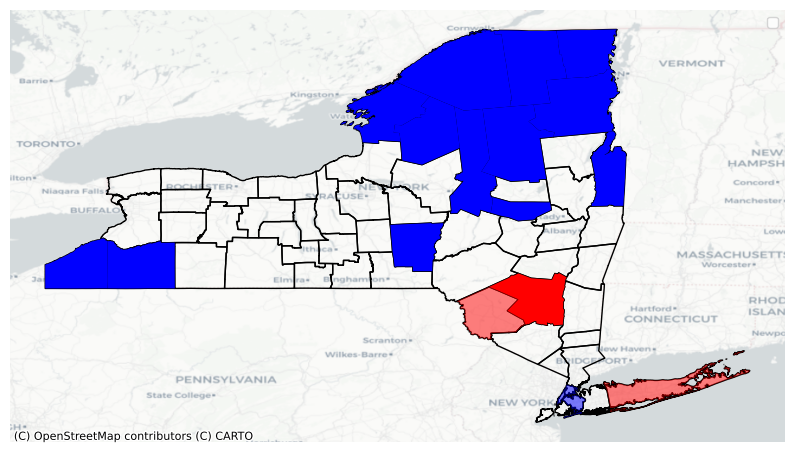

In [76]:
plot_moran_geo(gdf_nys_counties_farm_cts, count_col="ct_per_mi", plot_grid=False, threshold=miles_to_meters(30))

### County/tract farm cluster locations

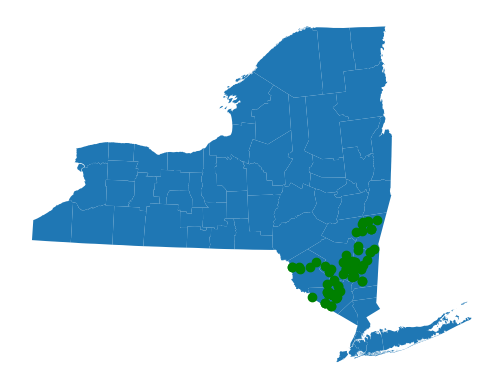

In [77]:
ax = gdf_nys_counties.to_crs(proj_hudson_ft).plot()
gdf.clip(gdf_farms_moran_cluster.dissolve()).clip(gdf_nys_counties.dissolve()).to_crs(proj_hudson_ft).plot(ax=ax, color="green")
ax.axis('off');

In [78]:
gdf_farms_core_moran = gdf.clip(gdf_farms_moran_cluster.dissolve()).clip(gdf_nys_counties.dissolve())

In [79]:
nys_county_moran = gdf_nys_counties[gdf_nys_counties.index.isin(gdf_nys_counties.sjoin(gdf_farms_core_moran, how="right", predicate="contains").index_left)]

In [80]:
county_fips_codes = nys_county_moran.FIPS_CODE.values

In [81]:
county_fips_codes

array(['36021', '36027', '36039', '36071', '36105', '36111'], dtype=object)

In [82]:
gdf_nys_tracts = gpd.read_file("data/tl_2022_36_tract.zip") # https://www2.census.gov/geo/tiger/TIGER2022/TRACT/tl_2022_36_tract.zip
gdf_nys_tracts.head()

,STATEFP,COUNTYFP,TRACTCE,GEOID,NAME,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,geometry
0,36,007,012702,36007012702,127.02,Census Tract 127.02,G5020,S,65461841,222705,+42.0350532,-075.9055509,"POLYGON ((-75.95917 42.00852, -75.95914 42.008..."
1,36,007,012800,36007012800,128,Census Tract 128,G5020,S,12342848,259435,+42.1298743,-075.9096569,"POLYGON ((-75.94766 42.13727, -75.94453 42.137..."
2,36,007,012900,36007012900,129,Census Tract 129,G5020,S,14480163,63649,+42.1522758,-075.9766029,"POLYGON ((-76.02229 42.15699, -76.01916 42.157..."
3,36,007,013000,36007013000,130,Census Tract 130,G5020,S,9934434,381729,+42.1236499,-076.0002197,"POLYGON ((-76.02417 42.1259, -76.02409 42.1259..."
4,36,007,013202,36007013202,132.02,Census Tract 132.02,G5020,S,2446208,3681,+42.1238924,-076.0311921,"POLYGON ((-76.03996 42.13284, -76.03862 42.132..."


In [83]:
gdf_nys_tracts["county_fips"] = gdf_nys_tracts.GEOID.apply(lambda x: str(x[:5]))
gdf_nys_tracts.head()

,STATEFP,COUNTYFP,TRACTCE,GEOID,NAME,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,geometry,county_fips
0,36,007,012702,36007012702,127.02,Census Tract 127.02,G5020,S,65461841,222705,+42.0350532,-075.9055509,"POLYGON ((-75.95917 42.00852, -75.95914 42.008...",36007
1,36,007,012800,36007012800,128,Census Tract 128,G5020,S,12342848,259435,+42.1298743,-075.9096569,"POLYGON ((-75.94766 42.13727, -75.94453 42.137...",36007
2,36,007,012900,36007012900,129,Census Tract 129,G5020,S,14480163,63649,+42.1522758,-075.9766029,"POLYGON ((-76.02229 42.15699, -76.01916 42.157...",36007
3,36,007,013000,36007013000,130,Census Tract 130,G5020,S,9934434,381729,+42.1236499,-076.0002197,"POLYGON ((-76.02417 42.1259, -76.02409 42.1259...",36007
4,36,007,013202,36007013202,132.02,Census Tract 132.02,G5020,S,2446208,3681,+42.1238924,-076.0311921,"POLYGON ((-76.03996 42.13284, -76.03862 42.132...",36007


In [84]:
gdf_nys_tracts_hudson = gdf_nys_tracts[gdf_nys_tracts.county_fips.isin(county_fips_codes)].copy()
gdf_nys_tracts_hudson

,STATEFP,COUNTYFP,TRACTCE,GEOID,NAME,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,geometry,county_fips
104,36,105,951701,36105951701,9517.01,Census Tract 9517.01,G5020,S,80751463,4230629,+41.6252683,-074.6109770,"POLYGON ((-74.66988 41.65896, -74.66986 41.659...",36105
105,36,105,951801,36105951801,9518.01,Census Tract 9518.01,G5020,S,9416768,161484,+41.6353707,-074.6665861,"POLYGON ((-74.70609 41.66335, -74.70562 41.663...",36105
106,36,105,951302,36105951302,9513.02,Census Tract 9513.02,G5020,S,79633377,998387,+41.6346723,-074.4914470,"POLYGON ((-74.5629 41.60582, -74.56161 41.6074...",36105
107,36,105,951802,36105951802,9518.02,Census Tract 9518.02,G5020,S,3677536,74552,+41.6500499,-074.7108274,"POLYGON ((-74.72106 41.64642, -74.7208 41.6479...",36105
108,36,105,950801,36105950801,9508.01,Census Tract 9508.01,G5020,S,35408221,1338257,+41.7864811,-074.6607209,"POLYGON ((-74.70422 41.78997, -74.70296 41.792...",36105
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5280,36,027,060302,36027060302,603.02,Census Tract 603.02,G5020,S,15574352,318587,+41.5068453,-073.8779631,"POLYGON ((-73.9032 41.50151, -73.90319 41.5016...",36027
5294,36,027,060400,36027060400,604,Census Tract 604,G5020,S,2172617,10296,+41.5339080,-073.8931308,"POLYGON ((-73.91113 41.53064, -73.9104 41.5313...",36027
5301,36,027,640002,36027640002,6400.02,Census Tract 6400.02,G5020,S,1658142,7417,+41.5216636,-073.9534317,"POLYGON ((-73.96318 41.51919, -73.96299 41.519...",36027
5302,36,027,130004,36027130004,1300.04,Census Tract 1300.04,G5020,S,24394730,363637,+41.7909753,-073.8382016,"POLYGON ((-73.86601 41.81412, -73.86428 41.814...",36027


<Axes: >

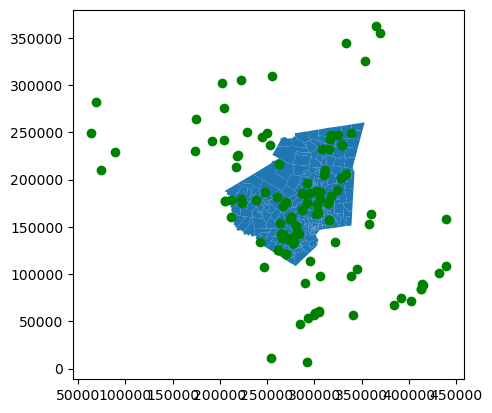

In [85]:
ax = gdf_nys_tracts_hudson.to_crs(proj_hudson_ft).plot()
gdf_near_nys.to_crs(proj_hudson_ft).plot(ax=ax, color="green")

<Axes: >

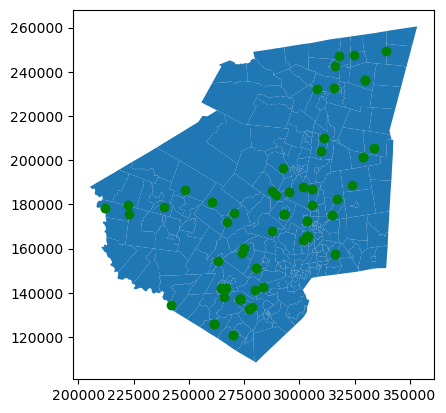

In [86]:
ax = gdf_nys_tracts_hudson.to_crs(proj_hudson_ft).plot()
gdf_farms_core_moran.to_crs(proj_hudson_ft).plot(ax=ax, color="green")

In [87]:
gdf_nys_tracts_hudson = gdf_nys_tracts_hudson.to_crs(6933)

### Count farms within 5 miles of each tract

In [196]:
gdf_nys_tracts_hudson_buff = gdf_nys_tracts_hudson.copy()

In [197]:
gdf_nys_tracts_hudson_buff["geometry"] = gdf_nys_tracts_hudson_buff.to_crs(proj_nys_east).buffer(miles_to_meters(5))

In [198]:
gdf_nys_tracts_hudson_buff = gdf_nys_tracts_hudson_buff.sjoin(gdf.to_crs(proj_nys_east), how="left", predicate="contains")
tract_counts = gdf_nys_tracts_hudson_buff.groupby("GEOID").size()
tract_counts

GEOID
36021000100    1
36021000200    1
36021000300    5
36021000401    6
36021000402    2
              ..
36111954900    2
36111955001    4
36111955002    3
36111955300    1
36111955400    1
Length: 294, dtype: int64

In [199]:
tract_counts = tract_counts.reset_index().rename(columns={0: "farms_within_5_mi"})
tract_counts.head()

,GEOID,farms_within_5_mi
0,36021000100,1
1,36021000200,1
2,36021000300,5
3,36021000401,6
4,36021000402,2


In [200]:
gdf_nys_tracts_hudson = gdf_nys_tracts_hudson.merge(tract_counts, how="left", on="GEOID")

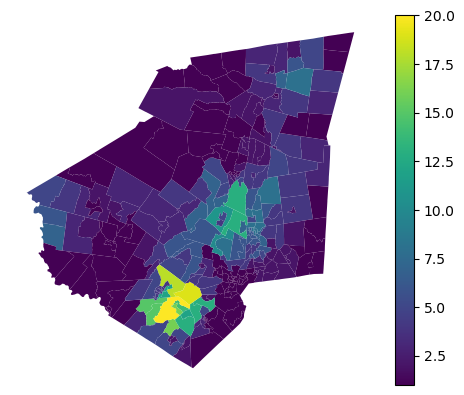

In [201]:
ax = gdf_nys_tracts_hudson.to_crs(proj_hudson_ft).plot(column="farms_within_5_mi", label="No. farms within 5 mi", legend=True)
ax.axis("off");

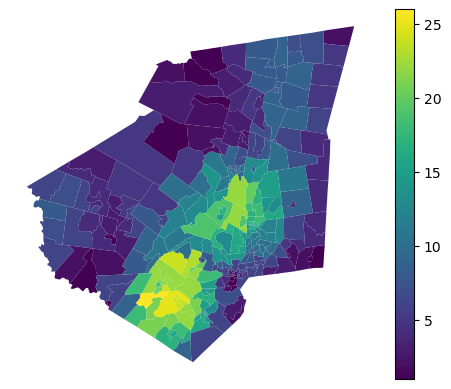

In [203]:
gdf_nys_tracts_hudson_buff = gdf_nys_tracts_hudson.copy()
gdf_nys_tracts_hudson_buff["geometry"] = gdf_nys_tracts_hudson_buff.to_crs(proj_nys_east).buffer(miles_to_meters(10))
gdf_nys_tracts_hudson_buff = gdf_nys_tracts_hudson_buff.sjoin(gdf.to_crs(proj_nys_east), how="left", predicate="contains")
tract_counts = gdf_nys_tracts_hudson_buff.groupby("GEOID").size()
tract_counts = tract_counts.reset_index().rename(columns={0: "farms_within_10_mi"})
gdf_nys_tracts_hudson = gdf_nys_tracts_hudson.merge(tract_counts, how="left", on="GEOID")

ax = gdf_nys_tracts_hudson.to_crs(proj_hudson_ft).plot(column="farms_within_10_mi", label="No. farms within 10 mi", legend=True)
ax.axis("off");

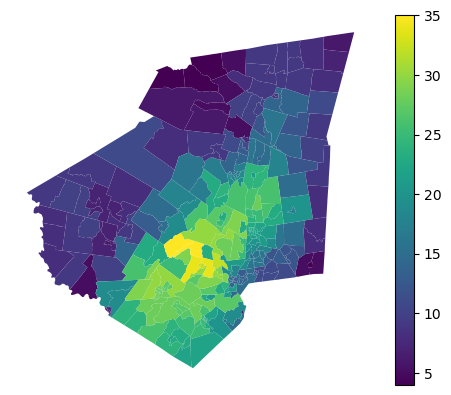

In [205]:
gdf_nys_tracts_hudson_buff = gdf_nys_tracts_hudson.copy()
gdf_nys_tracts_hudson_buff["geometry"] = gdf_nys_tracts_hudson_buff.to_crs(proj_nys_east).buffer(miles_to_meters(15))
gdf_nys_tracts_hudson_buff = gdf_nys_tracts_hudson_buff.sjoin(gdf.to_crs(proj_nys_east), how="left", predicate="contains")
tract_counts = gdf_nys_tracts_hudson_buff.groupby("GEOID").size()
tract_counts = tract_counts.reset_index().rename(columns={0: "farms_within_15_mi"})
gdf_nys_tracts_hudson = gdf_nys_tracts_hudson.merge(tract_counts, how="left", on="GEOID")

ax = gdf_nys_tracts_hudson.to_crs(proj_hudson_ft).plot(column="farms_within_15_mi", label="No. farms within 15 mi", legend=True)
ax.axis("off");

## HDBSCAN Clustering

Changing the minimum epsilon merges together clusters within a specified distance of each other; lowering `min_samples` makes the algorithm less conservative, so more distant/outlier points are assumed to belong to clusters. However, the low probability score for some of these points will still show their smaller likelihood of belonging to that cluster.

Since the purpose of this clustering exercise is not to show what very localized clusters exist but rather to find the "core" of the farms, my adjustment of the parameters is meant to help find a single large cluster that represents that core. I consider farms within ~10-15 miles of each other to be "near" each other.

c:\Users\Darcy Krasne\.conda\envs\info615\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\Darcy Krasne\.conda\envs\info615\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


9


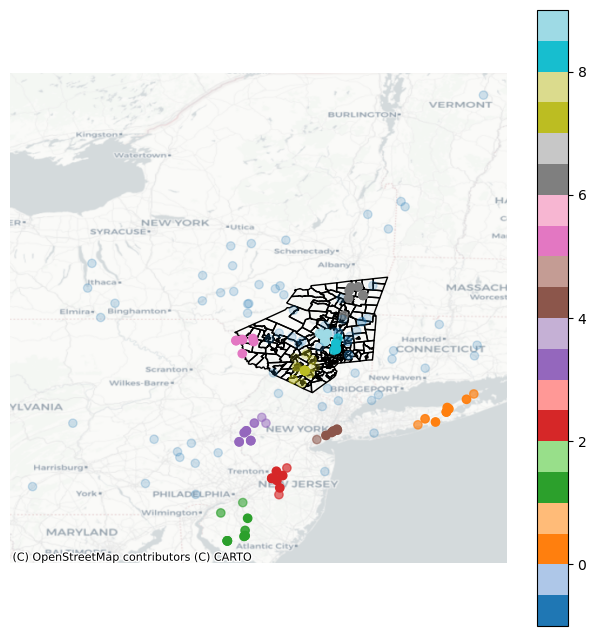

In [95]:
clusterer = hdbscan.HDBSCAN()
clusterer.fit(coords)
print(max(clusterer.labels_))

gdf["clusters_default"] = clusterer.labels_
alpha = [0.2 if prob == 0 else prob for prob in clusterer.probabilities_]

ax = gdf_nys_tracts_hudson.plot(facecolor="none", edgecolor="black", figsize=(8,8))
gdf.plot(ax=ax, column="clusters_default", legend=True, cmap="tab20", alpha=alpha)
cx.add_basemap(ax=ax, crs=gdf.crs, source=cx.providers.CartoDB.Positron)
ax.axis("off");

c:\Users\Darcy Krasne\.conda\envs\info615\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\Darcy Krasne\.conda\envs\info615\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


9


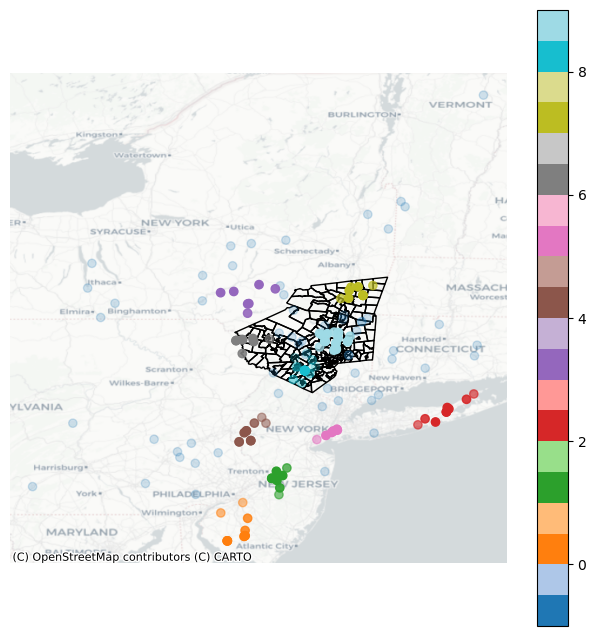

In [96]:
clusterer = hdbscan.HDBSCAN()
clusterer.fit(coords_nys)
print(max(clusterer.labels_))

gdf["clusters_default_nysproj"] = clusterer.labels_
alpha = [0.2 if prob == 0 else prob for prob in clusterer.probabilities_]

ax = gdf_nys_tracts_hudson.plot(facecolor="none", edgecolor="black", figsize=(8,8))
gdf.plot(ax=ax, column="clusters_default_nysproj", legend=True, cmap="tab20", alpha=alpha)
cx.add_basemap(ax=ax, crs=gdf.crs, source=cx.providers.CartoDB.Positron)
ax.axis("off");

c:\Users\Darcy Krasne\.conda\envs\info615\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\Darcy Krasne\.conda\envs\info615\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


10


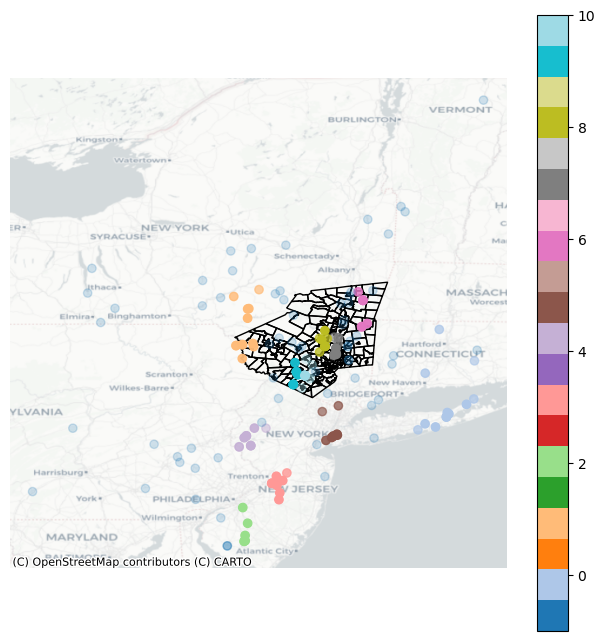

In [97]:
clusterer = hdbscan.HDBSCAN(metric="haversine")
clusterer.fit(coords_radians)
print(max(clusterer.labels_))

gdf["clusters_haversine"] = clusterer.labels_
alpha = [0.2 if prob == 0 else prob for prob in clusterer.probabilities_]

ax = gdf_nys_tracts_hudson.plot(facecolor="none", edgecolor="black", figsize=(8,8))
gdf.plot(ax=ax, column="clusters_haversine", legend=True, cmap="tab20", alpha=alpha)
cx.add_basemap(ax=ax, crs=gdf.crs, source=cx.providers.CartoDB.Positron)
ax.axis("off");

c:\Users\Darcy Krasne\.conda\envs\info615\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\Darcy Krasne\.conda\envs\info615\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


8


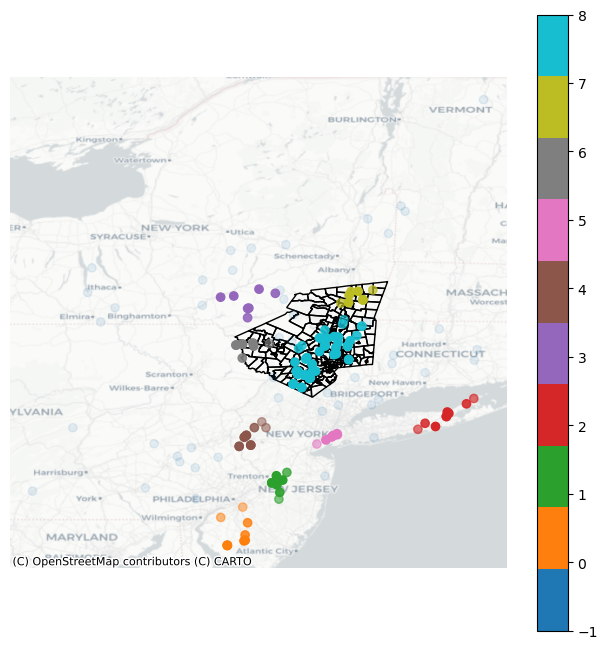

In [128]:
clusterer = hdbscan.HDBSCAN(min_cluster_size=5, cluster_selection_epsilon=miles_to_meters(10))
clusterer.fit(coords_nys)
print(max(clusterer.labels_))

gdf["clusters_minclust5_eps10mi"] = clusterer.labels_
alpha = [0.1 if prob == 0 else prob for prob in clusterer.probabilities_]
ax = gdf_nys_tracts_hudson.plot(facecolor="none", figsize=(8,8), edgecolor="black")
gdf.plot(ax=ax, column="clusters_minclust5_eps10mi", cmap="tab10", legend=True, alpha=alpha)
cx.add_basemap(ax=ax, crs=gdf.crs, source=cx.providers.CartoDB.Positron)
ax.axis("off");

c:\Users\Darcy Krasne\.conda\envs\info615\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\Darcy Krasne\.conda\envs\info615\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


7


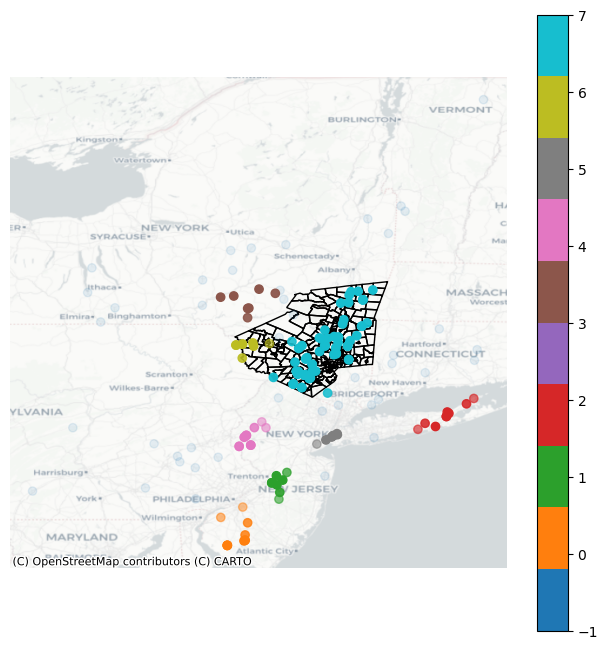

In [130]:
clusterer = hdbscan.HDBSCAN(min_cluster_size=5, cluster_selection_epsilon=miles_to_meters(15))
clusterer.fit(coords_nys)
print(max(clusterer.labels_))

gdf["clusters_minclust5_eps15mi"] = clusterer.labels_
alpha = [0.1 if prob == 0 else prob for prob in clusterer.probabilities_]
ax = gdf_nys_tracts_hudson.plot(facecolor="none", figsize=(8,8), edgecolor="black")
gdf.plot(ax=ax, column="clusters_minclust5_eps15mi", cmap="tab10", legend=True, alpha=alpha)
cx.add_basemap(ax=ax, crs=gdf.crs, source=cx.providers.CartoDB.Positron)
ax.axis("off");

c:\Users\Darcy Krasne\.conda\envs\info615\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\Darcy Krasne\.conda\envs\info615\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


7


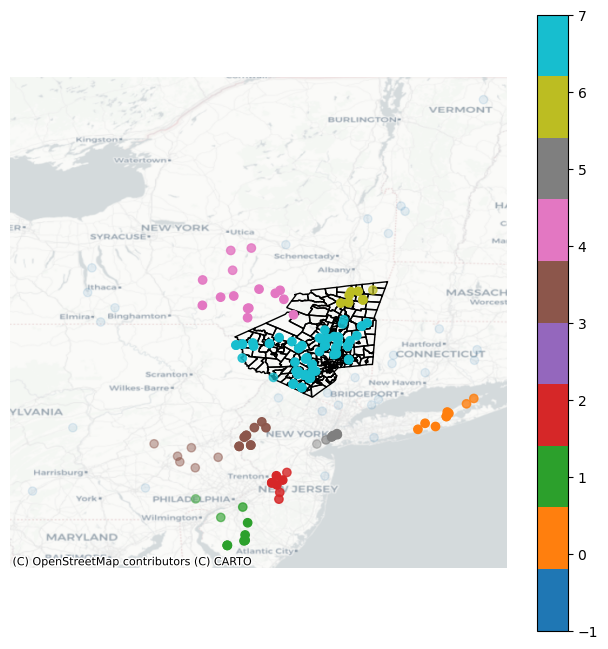

In [100]:
clusterer = hdbscan.HDBSCAN(min_samples=1, min_cluster_size=5, cluster_selection_epsilon=miles_to_meters(10))
clusterer.fit(coords_nys)
print(max(clusterer.labels_))

gdf["clusters_minsamp1_minclust5_eps10mi"] = clusterer.labels_
alpha = [0.1 if prob == 0 else prob for prob in clusterer.probabilities_]
ax = gdf_nys_tracts_hudson.plot(facecolor="none", figsize=(8,8), edgecolor="black")
gdf.plot(ax=ax, column="clusters_minsamp1_minclust5_eps10mi", cmap="tab10", legend=True, alpha=alpha)
cx.add_basemap(ax=ax, crs=gdf.crs, source=cx.providers.CartoDB.Positron)
ax.axis("off");

c:\Users\Darcy Krasne\.conda\envs\info615\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\Darcy Krasne\.conda\envs\info615\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


8


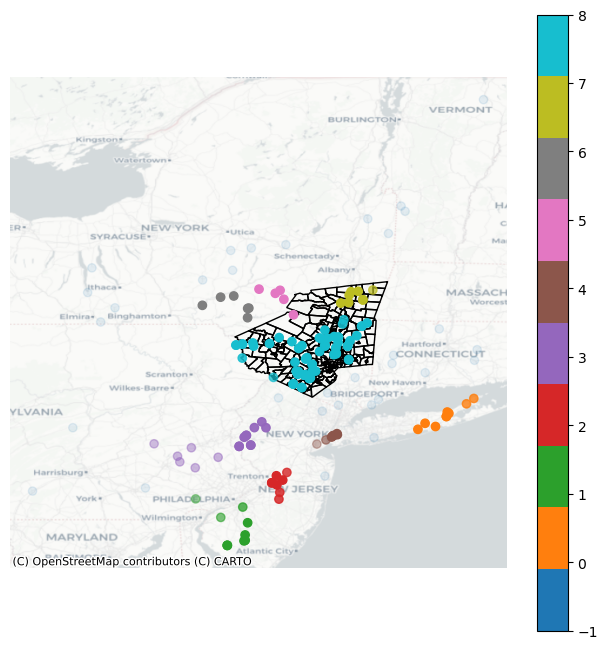

In [101]:
clusterer = hdbscan.HDBSCAN(min_samples=1, min_cluster_size=5, cluster_selection_epsilon=miles_to_meters(10), cluster_selection_method="leaf")
clusterer.fit(coords_nys)
print(max(clusterer.labels_))

gdf["clusters_minsamp1_minclust5_eps10mi_leaf"] = clusterer.labels_
alpha = [0.1 if prob == 0 else prob for prob in clusterer.probabilities_]
ax = gdf_nys_tracts_hudson.plot(facecolor="none", figsize=(8,8), edgecolor="black")
gdf.plot(ax=ax, column="clusters_minsamp1_minclust5_eps10mi_leaf", cmap="tab10", legend=True, alpha=alpha)
cx.add_basemap(ax=ax, crs=gdf.crs, source=cx.providers.CartoDB.Positron)
ax.axis("off");

c:\Users\Darcy Krasne\.conda\envs\info615\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\Darcy Krasne\.conda\envs\info615\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


6


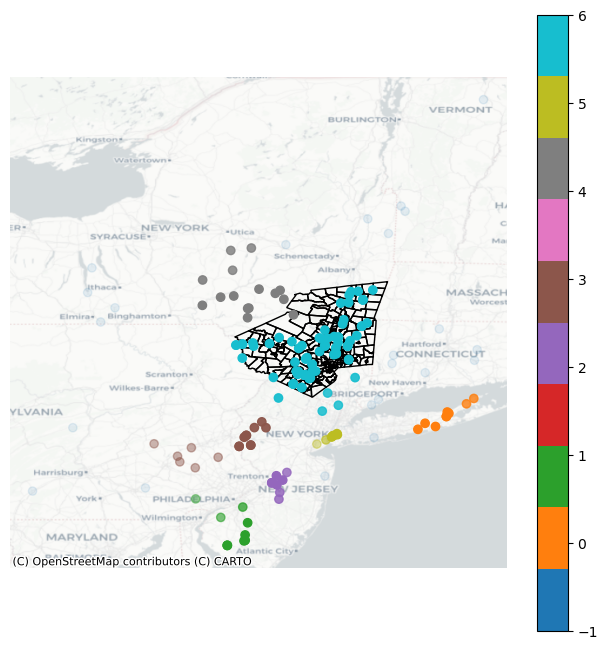

In [102]:
clusterer = hdbscan.HDBSCAN(min_samples=1, min_cluster_size=5, cluster_selection_epsilon=miles_to_meters(15))
clusterer.fit(coords_nys)
print(max(clusterer.labels_))

gdf["clusters_minsamp1_minclust5_eps15mi"] = clusterer.labels_
alpha = [0.1 if prob == 0 else prob for prob in clusterer.probabilities_]
ax = gdf_nys_tracts_hudson.plot(facecolor="none", figsize=(8,8), edgecolor="black")
gdf.plot(ax=ax, column="clusters_minsamp1_minclust5_eps15mi", cmap="tab10", legend=True, alpha=alpha)
cx.add_basemap(ax=ax, crs=gdf.crs, source=cx.providers.CartoDB.Positron)
ax.axis("off");

c:\Users\Darcy Krasne\.conda\envs\info615\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\Darcy Krasne\.conda\envs\info615\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


7


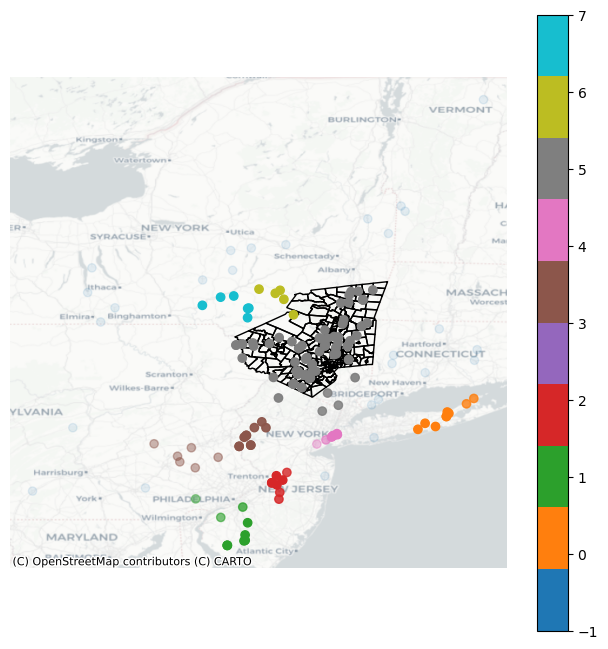

In [103]:
clusterer = hdbscan.HDBSCAN(min_samples=1, min_cluster_size=5, cluster_selection_epsilon=miles_to_meters(15), cluster_selection_method="leaf")
clusterer.fit(coords_nys)
print(max(clusterer.labels_))

gdf["clusters_minsamp1_minclust5_eps15mi_leaf"] = clusterer.labels_
alpha = [0.1 if prob == 0 else prob for prob in clusterer.probabilities_]
ax = gdf_nys_tracts_hudson.plot(facecolor="none", figsize=(8,8), edgecolor="black")
gdf.plot(ax=ax, column="clusters_minsamp1_minclust5_eps15mi_leaf", cmap="tab10", legend=True, alpha=alpha)
cx.add_basemap(ax=ax, crs=gdf.crs, source=cx.providers.CartoDB.Positron)
ax.axis("off");

c:\Users\Darcy Krasne\.conda\envs\info615\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\Darcy Krasne\.conda\envs\info615\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


7


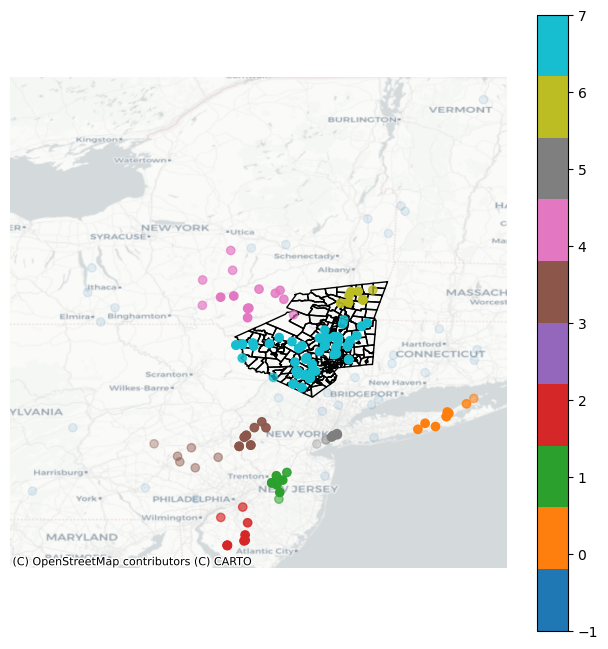

In [105]:
clusterer = hdbscan.HDBSCAN(min_samples=2, min_cluster_size=5, cluster_selection_epsilon=miles_to_meters(10))
clusterer.fit(coords_nys)
print(max(clusterer.labels_))

gdf["clusters_minsamp2_minclust5_eps10mi"] = clusterer.labels_
alpha = [0.1 if prob == 0 else prob for prob in clusterer.probabilities_]

ax = gdf_nys_tracts_hudson.plot(facecolor="none", figsize=(8,8), edgecolor="black")
gdf.plot(ax=ax, column="clusters_minsamp2_minclust5_eps10mi", cmap="tab10", legend=True, alpha=alpha)
cx.add_basemap(ax=ax, crs=gdf.crs, source=cx.providers.CartoDB.Positron)
ax.axis("off");

c:\Users\Darcy Krasne\.conda\envs\info615\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\Darcy Krasne\.conda\envs\info615\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


8


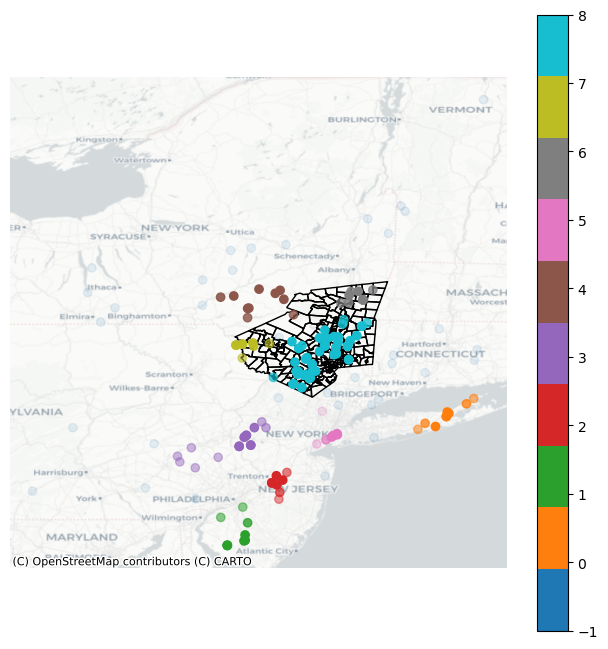

In [112]:
clusterer = hdbscan.HDBSCAN(min_samples=3, min_cluster_size=5, cluster_selection_epsilon=miles_to_meters(10))
clusterer.fit(coords_nys)
print(max(clusterer.labels_))

gdf["clusters_minsamp3_minclust5_eps10mi"] = clusterer.labels_
alpha = [0.1 if prob == 0 else prob for prob in clusterer.probabilities_]

ax = gdf_nys_tracts_hudson.plot(facecolor="none", figsize=(8,8), edgecolor="black")
gdf.plot(ax=ax, column="clusters_minsamp3_minclust5_eps10mi", cmap="tab10", legend=True, alpha=alpha)
cx.add_basemap(ax=ax, crs=gdf.crs, source=cx.providers.CartoDB.Positron)
ax.axis("off");

c:\Users\Darcy Krasne\.conda\envs\info615\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\Darcy Krasne\.conda\envs\info615\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


6


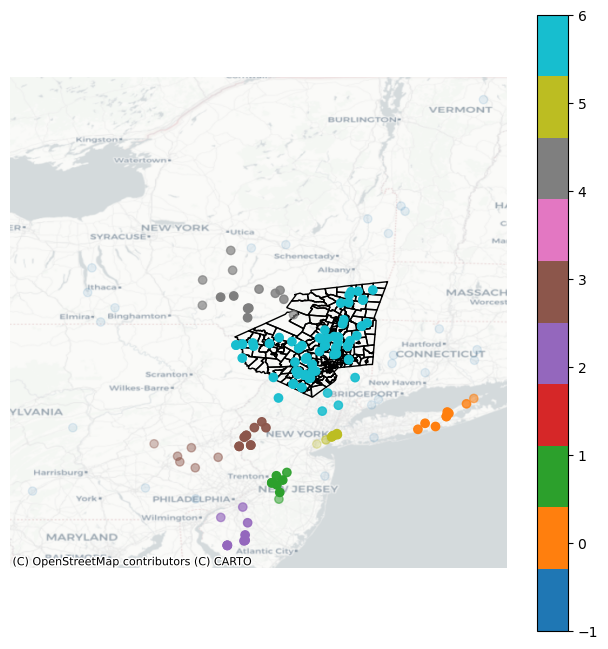

In [107]:
clusterer = hdbscan.HDBSCAN(min_samples=2, min_cluster_size=5, cluster_selection_epsilon=miles_to_meters(15))
clusterer.fit(coords_nys)
print(max(clusterer.labels_))

gdf["clusters_minsamp2_minclust5_eps15mi"] = clusterer.labels_
alpha = [0.1 if prob == 0 else prob for prob in clusterer.probabilities_]
ax = gdf_nys_tracts_hudson.plot(facecolor="none", figsize=(8,8), edgecolor="black")
gdf.plot(ax=ax, column="clusters_minsamp2_minclust5_eps15mi", cmap="tab10", legend=True, alpha=alpha)
cx.add_basemap(ax=ax, crs=gdf.crs, source=cx.providers.CartoDB.Positron)
ax.axis("off");

c:\Users\Darcy Krasne\.conda\envs\info615\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\Darcy Krasne\.conda\envs\info615\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


6


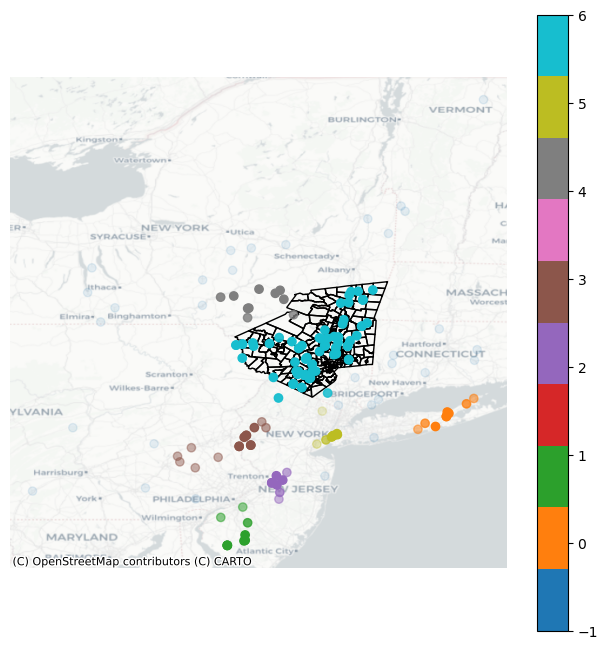

In [109]:
clusterer = hdbscan.HDBSCAN(min_samples=3, min_cluster_size=5, cluster_selection_epsilon=miles_to_meters(15))
clusterer.fit(coords_nys)
print(max(clusterer.labels_))

gdf["clusters_minsamp3_minclust5_eps15mi"] = clusterer.labels_
alpha = [0.1 if prob == 0 else prob for prob in clusterer.probabilities_]
ax = gdf_nys_tracts_hudson.plot(facecolor="none", figsize=(8,8), edgecolor="black")
gdf.plot(ax=ax, column="clusters_minsamp3_minclust5_eps15mi", cmap="tab10", legend=True, alpha=alpha)
cx.add_basemap(ax=ax, crs=gdf.crs, source=cx.providers.CartoDB.Positron)
ax.axis("off");

c:\Users\Darcy Krasne\.conda\envs\info615\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\Darcy Krasne\.conda\envs\info615\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


6


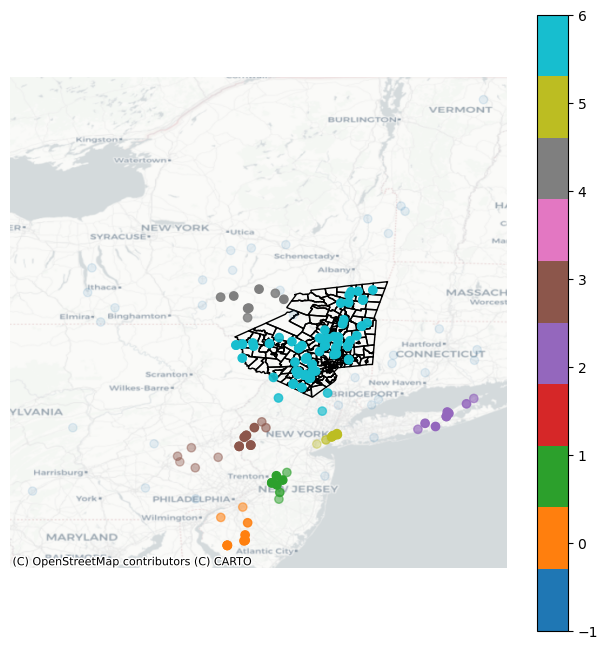

In [110]:
clusterer = hdbscan.HDBSCAN(min_samples=4, min_cluster_size=5, cluster_selection_epsilon=miles_to_meters(15))
clusterer.fit(coords_nys)
print(max(clusterer.labels_))

gdf["clusters_minsamp4_minclust5_eps15mi"] = clusterer.labels_
alpha = [0.1 if prob == 0 else prob for prob in clusterer.probabilities_]
ax = gdf_nys_tracts_hudson.plot(facecolor="none", figsize=(8,8), edgecolor="black")
gdf.plot(ax=ax, column="clusters_minsamp4_minclust5_eps15mi", cmap="tab10", legend=True, alpha=alpha)
cx.add_basemap(ax=ax, crs=gdf.crs, source=cx.providers.CartoDB.Positron)
ax.axis("off");

c:\Users\Darcy Krasne\.conda\envs\info615\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\Darcy Krasne\.conda\envs\info615\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


6


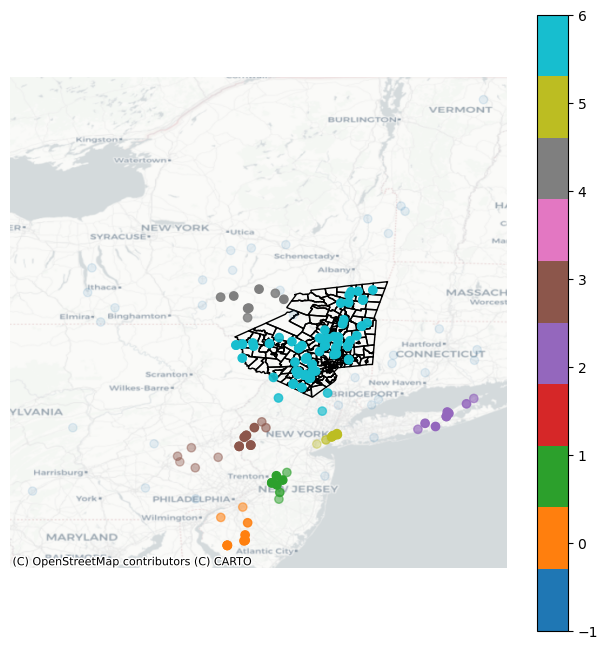

In [111]:
clusterer = hdbscan.HDBSCAN(min_samples=4, min_cluster_size=5, cluster_selection_epsilon=miles_to_meters(15), cluster_selection_method="leaf")
clusterer.fit(coords_nys)
print(max(clusterer.labels_))

gdf["clusters_minsamp4_minclust5_eps15mi_leaf"] = clusterer.labels_
alpha = [0.1 if prob == 0 else prob for prob in clusterer.probabilities_]
ax = gdf_nys_tracts_hudson.plot(facecolor="none", figsize=(8,8), edgecolor="black")
gdf.plot(ax=ax, column="clusters_minsamp4_minclust5_eps15mi_leaf", cmap="tab10", legend=True, alpha=alpha)
cx.add_basemap(ax=ax, crs=gdf.crs, source=cx.providers.CartoDB.Positron)
ax.axis("off");

c:\Users\Darcy Krasne\.conda\envs\info615\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\Darcy Krasne\.conda\envs\info615\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


7


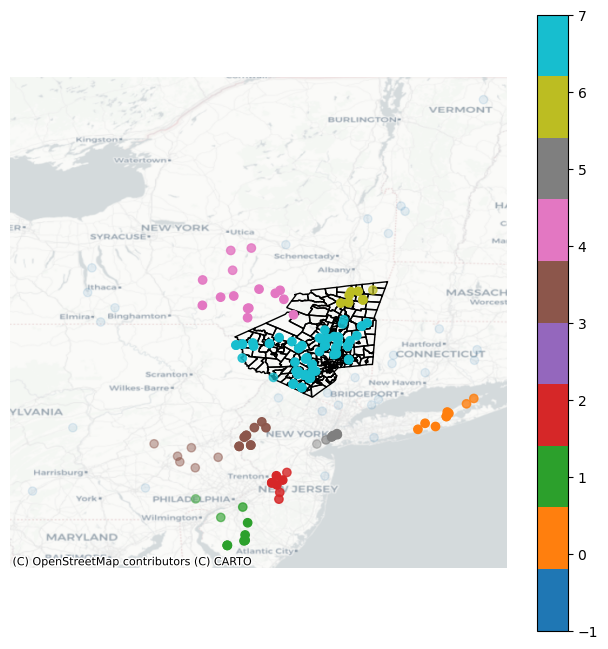

In [113]:
clusterer = hdbscan.HDBSCAN(min_samples=1, min_cluster_size=5, cluster_selection_epsilon=miles_to_meters(13))
clusterer.fit(coords_nys)
print(max(clusterer.labels_))

gdf["clusters_minsamp1_minclust5_eps13mi"] = clusterer.labels_
alpha = [0.1 if prob == 0 else prob for prob in clusterer.probabilities_]
ax = gdf_nys_tracts_hudson.plot(facecolor="none", figsize=(8,8), edgecolor="black")
gdf.plot(ax=ax, column="clusters_minsamp1_minclust5_eps13mi", cmap="tab10", legend=True, alpha=alpha)
cx.add_basemap(ax=ax, crs=gdf.crs, source=cx.providers.CartoDB.Positron)
ax.axis("off");

### Isolate core Hudson Valley farms

take farms in minsamp 1, clustersize 5, epsilon 15
remove farms not in a cluster when epsilon is 13

OR

farms that are in a 5-15 cluster at all sample sizes?

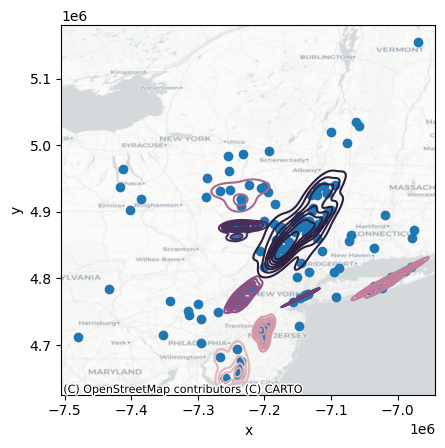

In [226]:
ax = gdf.plot()
cx.add_basemap(ax=ax, crs=gdf.crs, source=cx.providers.CartoDB.Positron)
sns.kdeplot(ax=ax,
            x=gdf["x"],
            y=gdf["y"],
            hue=gdf["clusters_minclust5_eps15mi"],
            legend=False);

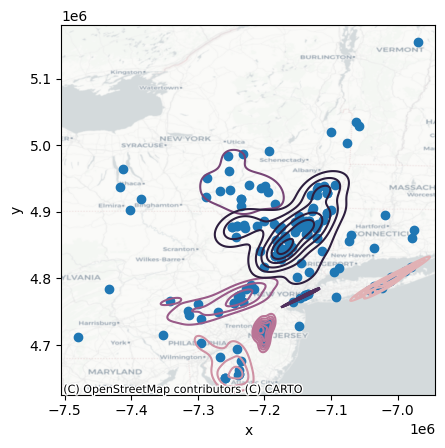

In [227]:
ax = gdf.plot()
cx.add_basemap(ax=ax, crs=gdf.crs, source=cx.providers.CartoDB.Positron)
sns.kdeplot(ax=ax,
            x=gdf["x"],
            y=gdf["y"],
            hue=gdf["clusters_minsamp1_minclust5_eps15mi"],
            legend=False);

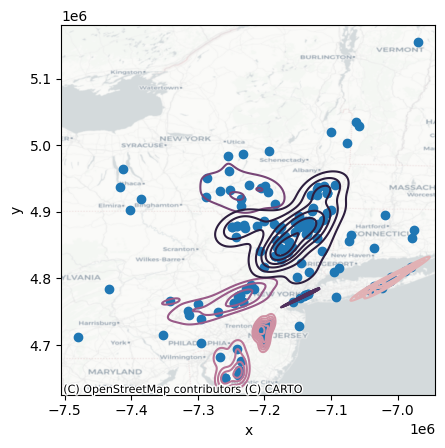

In [228]:
ax = gdf.plot()
cx.add_basemap(ax=ax, crs=gdf.crs, source=cx.providers.CartoDB.Positron)
sns.kdeplot(ax=ax,
            x=gdf["x"],
            y=gdf["y"],
            hue=gdf["clusters_minsamp2_minclust5_eps15mi"],
            legend=False);

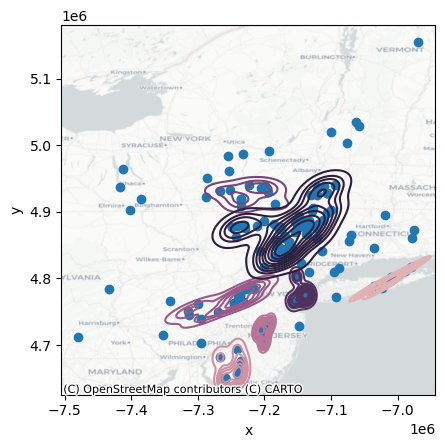

In [229]:
ax = gdf.plot()
cx.add_basemap(ax=ax, crs=gdf.crs, source=cx.providers.CartoDB.Positron)
sns.kdeplot(ax=ax,
            x=gdf["x"],
            y=gdf["y"],
            hue=gdf["clusters_minsamp3_minclust5_eps15mi"],
            legend=False);

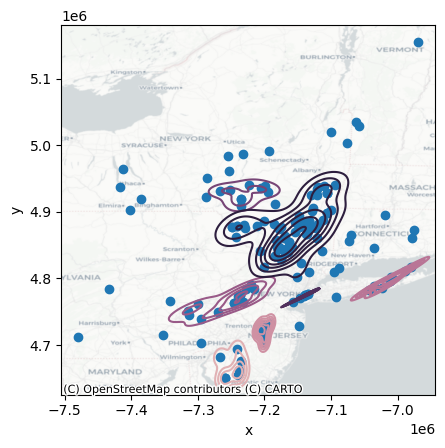

In [230]:
ax = gdf.plot()
cx.add_basemap(ax=ax, crs=gdf.crs, source=cx.providers.CartoDB.Positron)
sns.kdeplot(ax=ax,
            x=gdf["x"],
            y=gdf["y"],
            hue=gdf["clusters_minsamp4_minclust5_eps15mi"],
            legend=False);

In [159]:
for column in gdf.columns:
    if column.startswith("clusters") and column.endswith("eps15mi"):
        print(column)
        print(gdf.groupby(column).size().idxmax())
        print(gdf.groupby(column).size().max())
        print("no cluster:", gdf.groupby(column).size().iloc[0])

clusters_minsamp1_minclust5_eps15mi
6
83
no cluster: 23
clusters_minsamp2_minclust5_eps15mi
6
83
no cluster: 25
clusters_minsamp3_minclust5_eps15mi
6
80
no cluster: 32
clusters_minsamp4_minclust5_eps15mi
6
81
no cluster: 34
clusters_minclust5_eps15mi
7
70
no cluster: 43


In [138]:
gdf.groupby("clusters_minclust5_eps15mi").size()

clusters_minclust5_eps15mi
-1    43
 0    10
 1     8
 2     9
 3     7
 4    10
 5     7
 6     8
 7    70
dtype: int64

In [169]:
# farms_in_largest_cluster = set()
# farms_in_no_cluster = set()
# for column in gdf.columns:
#     if column.startswith("clusters") and column.endswith("eps15mi"):
#         idxmax = gdf.groupby(column).size().idxmax()
#         farms_in_largest_cluster.update(list(gdf.query(f"{column} == {idxmax}").index))
#         farms_in_no_cluster.update(list(gdf.query(f"{column} == -1").index))

farms_in_largest_cluster = []
farms_in_no_cluster = []
for column in gdf.columns:
    if column.startswith("clusters") and column.endswith("eps15mi"):
        idxmax = gdf.groupby(column).size().idxmax()
        farms_in_largest_cluster += list(gdf.query(f"{column} == {idxmax}").index)
        farms_in_no_cluster += list(gdf.query(f"{column} == -1").index)

len(farms_in_largest_cluster)

397

In [171]:
for farm in set(farms_in_no_cluster):
    if farm in farms_in_largest_cluster:
        print(farm)

145
148
167
44
117


In [174]:
for farm in set(farms_in_largest_cluster):
    if farms_in_largest_cluster.count(farm) < 5:
        print(f"{farm}: {farms_in_largest_cluster.count(farm)}")

32: 4
38: 4
43: 4
44: 2
95: 4
112: 4
117: 4
123: 4
140: 4
145: 2
148: 3
164: 4
167: 4


In [175]:
for farm in set(farms_in_largest_cluster):
    if farm in farms_in_no_cluster:
        print(f"{farm}: {farms_in_no_cluster.count(farm)}")

44: 3
117: 1
145: 3
148: 1
167: 1


In [177]:
farms_dubious = []
for farm in set(farms_in_largest_cluster):
    if farms_in_no_cluster.count(farm) > 1:
        farms_dubious.append(farm)
farms_dubious

[44, 145]

In [135]:
farm_indexes = []
for sampsize in range(1,5):
    farmcore = gdf.query(f"clusters_minsamp{sampsize}_minclust5_eps15mi >= 0")
    if len(farm_indexes) == 0:
        farm_indexes += (list(farmcore.index))
        print(len(farm_indexes))
    else:
        for farm in farm_indexes:
            if farm not in list(farmcore.index):
                farm_indexes.remove(farm)
for farm in list(gdf.index):
    if farm not in list(gdf.query(f"clusters_minclust5_eps15mi >= 0").index):
        try:
            farm_indexes.remove(farm)
        except:
            pass

len(farm_indexes)

149


129

<Axes: >

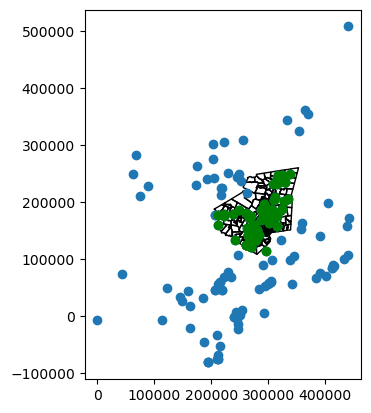

In [183]:
ax = gdf_nys_tracts_hudson.to_crs(proj_hudson_ft).plot(facecolor="none", edgecolor="black", legend=True)
gdf.to_crs(proj_hudson_ft).plot(ax=ax, label="Farm")
gdf[gdf.index.isin(farms_in_largest_cluster) & ~gdf.index.isin(farms_dubious)].query("state == 'NY'").to_crs(proj_hudson_ft).plot(ax=ax, label="Farm in cluster", color="green")
#gdf[gdf.index.isin(farms_in_no_cluster)].to_crs(proj_hudson_ft).plot(ax=ax, label="Farm in no cluster", color="red", alpha=0.5)

In [184]:
gdf_farms_core_hdbscan = gdf[gdf.index.isin(farms_in_largest_cluster) & ~gdf.index.isin(farms_dubious)].query("state == 'NY'").copy()
len(gdf_farms_core_hdbscan)

77

In [185]:
len(gdf_farms_core_moran)

75

<Axes: >

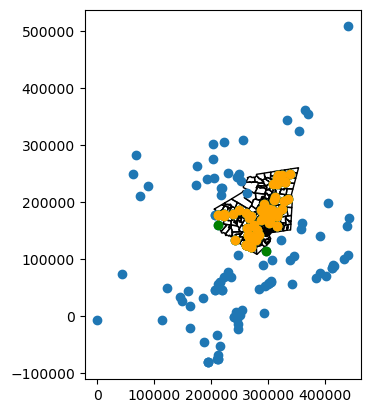

In [186]:
ax = gdf_nys_tracts_hudson.to_crs(proj_hudson_ft).plot(facecolor="none", edgecolor="black", legend=True)
gdf.to_crs(proj_hudson_ft).plot(ax=ax, label="Farm")
gdf_farms_core_hdbscan.to_crs(proj_hudson_ft).plot(ax=ax, label="HDBSCAN", color="green")
gdf_farms_core_moran.to_crs(proj_hudson_ft).plot(ax=ax, label="Moran", color="orange")

In [206]:
gdf_farms_core_hdbscan.to_crs(proj_hudson_ft).explore()

In [207]:
gdf_farms_core_moran.to_crs(proj_hudson_ft).explore()

In [217]:
gdf_core = gpd.read_file("data/farms_clean.geojson")

In [218]:
gdf_core = gdf_core.assign(moran = False).assign(hdbscan = False)

In [219]:
for row in gdf_core.iterrows():
    if row[0] in gdf_farms_core_moran.index:
        gdf_core.loc[row[0], "moran"] = True
    if row[0] in gdf_farms_core_hdbscan.index:
        gdf_core.loc[row[0], "hdbscan"] = True
gdf_core.head()

,OBJECTID,name,town,location,farm_type,website,state,farming,livestock,honey,geometry,moran,hdbscan
0,1,Liberty Farms,"Ghent, NY 12075","Columbia County, NY",Vegetables,http://www.libertyfarmsny.com/,NY,,,,POINT (-73.64185 42.29363),True,True
1,2,Cherry Lane Farms,"Bridgeton, NJ 08302","Cumberland County, NJ",Vegetables,n/a,NJ,,,,POINT (-75.23408 39.42734),False,False
2,3,D&V Farms,"Swedesboro, NJ 08085","Gloucester County, NJ",Vegetables,http://www.dandvorganics.com/,NJ,,,,POINT (-75.31047 39.74761),False,False
3,4,Down Home Acres,"Unadilla, NY 12849","Otsego County, NY",Vegetables,http://downhomeacres.weebly.com/,NY,,,,POINT (-75.3124 42.32536),False,False
4,5,El Mimomex,"Goshen, NY 10924","Orange County, NY",Vegetables,n/a,NY,,,,POINT (-74.32432 41.40204),True,True


In [220]:
gdf_core.to_file("data/farms_core.geojson", index=False)

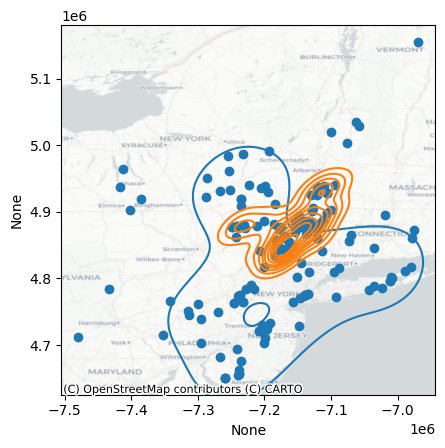

In [232]:
ax = gdf_core.to_crs(proj_ea).plot()
cx.add_basemap(ax=ax, crs=gdf_core.to_crs(proj_ea).crs, source=cx.providers.CartoDB.Positron)
sns.kdeplot(ax=ax,
            x=gdf_core.to_crs(proj_ea).geometry.x,
            y=gdf_core.to_crs(proj_ea).geometry.y,
            hue=gdf_core["moran"],
            legend=False);

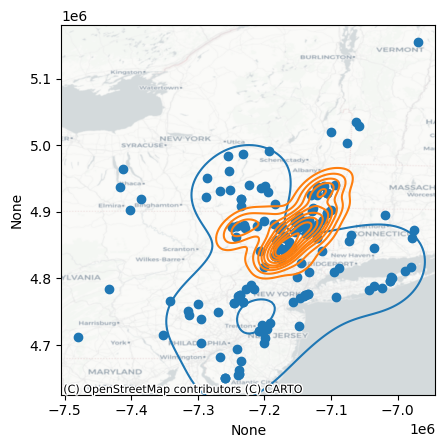

In [256]:
ax = gdf_core.to_crs(proj_ea).plot()
cx.add_basemap(ax=ax, crs=gdf_core.to_crs(proj_ea).crs, source=cx.providers.CartoDB.Positron)
sns.kdeplot(ax=ax,
            x=gdf_core.to_crs(proj_ea).geometry.x,
            y=gdf_core.to_crs(proj_ea).geometry.y,
            hue=gdf_core["hdbscan"],
            legend=False);

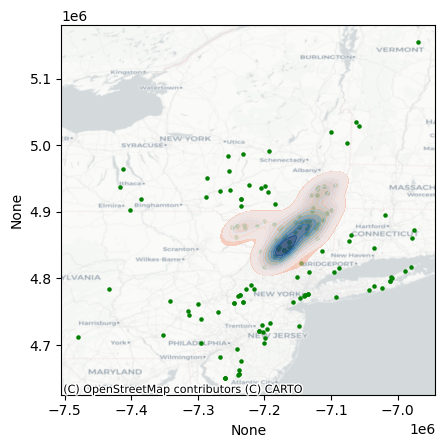

In [ ]:
ax = gdf_core.to_crs(proj_ea).plot(color="green", markersize=5)
cx.add_basemap(ax=ax, crs=gdf_core.to_crs(proj_ea).crs, source=cx.providers.CartoDB.Positron)
sns.kdeplot(ax=ax,
            x=gdf_core.query("hdbscan == True").to_crs(proj_ea).geometry.x,
            y=gdf_core.query("hdbscan == True").to_crs(proj_ea).geometry.y,
            hue=gdf_core["hdbscan"],
            fill=True,
            alpha=0.6,
            legend=False);
sns.kdeplot(ax=ax,
            x=gdf_core.query("moran == True").to_crs(proj_ea).geometry.x,
            y=gdf_core.query("moran == True").to_crs(proj_ea).geometry.y,
            fill=True,
            cmap="Blues",
            alpha=0.6,
            legend=False);


## Notes on things to add

ACS variables on housing tenure:
- B25003: Tenure
- B25038: Tenure by Year Householder Moved Into Unit
- B25039: Median Year Householder Moved Into Unit by Tenure

Recent article on farmers and housing in Hudson Valley: https://www.timesunion.com/hudsonvalley/makers/article/farmworker-housing-rising-rents-land-19433362.php

IPUMS Geographic Crosswalks for census tracts etc: https://www.nhgis.org/geographic-crosswalks

percentage of tract/county covered by agricultural zone?